# **Predicting Covid 19 ICU Hospitalizations**

April 12 2022 | Hugo Hiraoka | hhiraokawatts@gmail.com





###**Background**

The COVID-19 virus has already killed millions of people around the world.

When a COVID-19 patient arrives at the hospital, it is essential to assess if the patient should be sent home or if he/she should be admitted to the hospital because of the high risk of developing severe symptoms that will require admission to the Intensive Care Unit. This could save lives.

How can we determine if COVID-19-positive patients should be admitted to the Intensive Care Unit based on previous patient experiences and outcomes?

We will use data obtained during Triage and Laboratory tests made on COVID-19 patients to predict admission to the hospital should be required.

![](https://i.imgur.com/n1iJ1N7.jpg)

###**Problem Definition**

COVID-19 symptoms can quickly escalate from mild symptoms to severe. Most COVID-19-positive patients first had influenza-like symptoms. But many of those patients ended up in the ICU in a fight to survive.

The objective is to predict if a COVID-19 patient should be admitted to the hospital or treated at home. If a patient is likely to end up in the ICU, he/she should be admitted to the hospital and not allowed to go home.

###**Objective**

Classify patients into 2 classes: ICU and no-ICU.
Provide insights.

###**Dataset**

The dataset can be found at https://www.kaggle.com/datasets/S%C3%ADrio-Libanes/covid19

This dataset was produced by the Hospital Sirio-Libanes in Sao Paulo, Brazil and it contains 231 fields and 1925 entries. It contains Covid-19 patient information gathered during the triage process.

Brazil has been one of the countries with the highest number of COVID-19 deaths and infections.

Target: Predict if the patient should be admitted to the ICU.


<img src="https://i.ibb.co/99hTnB4/covid-icu-dataset-general.jpg" alt="covid-icu-dataset-general" border="0">
<img src="https://i.ibb.co/tprtTcX/covid-icu-dataset-vitals.jpg" alt="covid-icu-dataset-vitals" border="0">
<img src="https://i.ibb.co/R7B3Q6v/covid-icu-dataset-laboratory.jpg" alt="covid-icu-dataset-laboratory" border="0">

The dataset contains the following features:

**Demographics** 3 features
- Percentil Age
- Above 65 Years of age
- Gender

**Commorbities** 9 features

**Triage Measures, Lab data** 42 features
- Vital Signs : 36 features (6 types)
- Laboratory : 180 features (36 types)
- Time window

**Target**
- ICU hospitalization or not

###**Technique**

This is a supervised classification problem.

###**Import Libraries**
    

In [1]:
#yellowbrick is a machine learning visualization library. We will use it to
#visualize the cluster silhouettes.
!pip install yellowbrick

In [2]:
# Avoids scroll-in-the-scroll in the entire Notebook
from IPython.display import Javascript
def resize_colab_cell():
  display(Javascript('google.colab.output.setIframeHeight(0, true, {maxHeight: 5000})'))
get_ipython().events.register('pre_run_cell', resize_colab_cell)

In [3]:
%%HTML
<style type="text/css">
table.dataframe td, table.dataframe th {
    border: 1px black solid !important;
  color: black !important;
}

<IPython.core.display.Javascript object>

In [4]:
# Import libraries and packages

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import os

#KN clustering
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
import scipy.cluster.hierarchy as shc

from scipy.stats import zscore

# to compute distances
from scipy.spatial.distance import cdist, pdist
from sklearn.metrics import silhouette_score, silhouette_samples

from sklearn.decomposition import PCA

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# To impute missing values
#from sklearn.impute import SimpleImputer

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to create k folds of data and get cross validation score
#from sklearn.model_selection import KFold, StratifiedKFold
#from sklearn.model_selection import cross_val_score

# to use standard scaler
from sklearn.preprocessing import StandardScaler

#restrict float value to 3 decimal places
pd.set_option('display.float_format',lambda x: '%.3f' % x)
%matplotlib inline

<IPython.core.display.Javascript object>

In [5]:
#allow access to google drive
from google.colab import drive
drive.mount('/content/gdrive')

<IPython.core.display.Javascript object>

Mounted at /content/gdrive


In [6]:
#read csv file and load into a panda dataframe
covid_icu_df = pd.read_csv('/content/gdrive/MyDrive/Projects/ML/Data/Sirio_Libanes_ICU.csv')

<IPython.core.display.Javascript object>

In [7]:
#make a copy of the original dataframe
covidicu_df = covid_icu_df.copy()

<IPython.core.display.Javascript object>

In [8]:
#get number of features and number of rows
num_cols = covidicu_df.shape[1]
num_rows = covidicu_df.shape[0]
print("Number of features: ",num_cols)
print("Number of entries   ",num_rows)

<IPython.core.display.Javascript object>

Number of features:  231
Number of entries    1925


In [9]:
#set the max number of columns
pd.set_option("display.max_columns",num_cols)

#set display to show all rows
pd.set_option('display.max_rows',num_rows)

<IPython.core.display.Javascript object>

In [10]:
#read header 10 first rows
covidicu_df.head(10)

<IPython.core.display.Javascript object>

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,P02_VENOUS_DIFF,PC02_ARTERIAL_MEDIAN,PC02_ARTERIAL_MEAN,PC02_ARTERIAL_MIN,PC02_ARTERIAL_MAX,PC02_ARTERIAL_DIFF,PC02_VENOUS_MEDIAN,PC02_VENOUS_MEAN,PC02_VENOUS_MIN,PC02_VENOUS_MAX,PC02_VENOUS_DIFF,PCR_MEDIAN,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
0,0,1,60th,0,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [11]:
#read tail 10 last rows
covidicu_df.tail(10)

<IPython.core.display.Javascript object>

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,P02_VENOUS_DIFF,PC02_ARTERIAL_MEDIAN,PC02_ARTERIAL_MEAN,PC02_ARTERIAL_MIN,PC02_ARTERIAL_MAX,PC02_ARTERIAL_DIFF,PC02_VENOUS_MEDIAN,PC02_VENOUS_MEAN,PC02_VENOUS_MIN,PC02_VENOUS_MAX,PC02_VENOUS_DIFF,PCR_MEDIAN,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
1915,383,0,40th,1,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [12]:
#characteristics of features
covidicu_df.describe()

<IPython.core.display.Javascript object>

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,P02_VENOUS_DIFF,PC02_ARTERIAL_MEDIAN,PC02_ARTERIAL_MEAN,PC02_ARTERIAL_MIN,PC02_ARTERIAL_MAX,PC02_ARTERIAL_DIFF,PC02_VENOUS_MEDIAN,PC02_VENOUS_MEAN,PC02_VENOUS_MIN,PC02_VENOUS_MAX,PC02_VENOUS_DIFF,PCR_MEDIAN,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,ICU
count,1925.000,1925.000,1925.000,1920.000,1920.000,1920.000,1920.000,1920.000,1920.000,1920.000,1920.000,1920.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000,821.000


<table style="border-bottom: 1px solid #ddd>
    <tr>
        <th>Feature</th>
        <th>Description</th>
        <th>Data type</th>
        <th>Values</th>
        <th>Recommendation</th>
    <th>
    <tr>
        <th>PATIENT_VISIT_IDENTIFIER</th>
        <th>unique patient number</th>
        <th>INT</th>
        <th>0,1,2,3/th>
        <th>may be useful</th>
    <th>
    <tr>
        <th>AGE_ABOVE65</th>
        <th>patient older than 65</th>
        <th>bool</th>
        <th>0 or 1/th>
        <th>useful</th>
    <th>
    <tr>
        <th>AGE_PERCENTIL</th>
        <th>unique patient number</th>
        <th>categorical</th>
        <th>40th, 60th, 70th, etc</th>
        <th>may be useful</th>
    <th>
    <tr>
        <th>DISEASE_GROUPING_1</th>
        <th>MENTAL DISORDER</th>
        <th>boolean</th>
        <th>0 or 1</th>
        <th>useful</th>
    <th>
    <tr>
        <th>DISEASE_GROUPING_2</th>
        <th>DRUG AND ALCOHOL ABUSE</th>
        <th>boolean</th>
        <th>0 or 1</th>
        <th>useful</th>
    <th>
    <tr>
        <th>DISEASE_GROUPING_3</th>
        <th>OBESITY</th>
        <th>boolean</th>
        <th>0 or 1</th>
        <th>useful</th>
    <th>
    <tr>
        <th>DISEASE_GROUPING_4</th>
        <th>COAGULOPATHY</th>
        <th>boolean</th>
        <th>0 or 1</th>
        <th>useful</th>
    <th>
    <tr>
        <th>DISEASE_GROUPING_5</th>
        <th>WEIGHT LOSS</th>
        <th>boolean</th>
        <th>0 or 1</th>
        <th>useful</th>
    <th>
    <tr>
        <th>DISEASE_GROUPING_6</th>
        <th>FLUID AND ELECTROLYTE LOSS</th>
        <th>boolean</th>
        <th>0 or 1</th>
        <th>useful</th>
    <th>



              

In [13]:
#features data types
covidicu_df.dtypes

<IPython.core.display.Javascript object>

PATIENT_VISIT_IDENTIFIER              int64
AGE_ABOVE65                           int64
AGE_PERCENTIL                        object
GENDER                                int64
DISEASE GROUPING 1                  float64
DISEASE GROUPING 2                  float64
DISEASE GROUPING 3                  float64
DISEASE GROUPING 4                  float64
DISEASE GROUPING 5                  float64
DISEASE GROUPING 6                  float64
HTN                                 float64
IMMUNOCOMPROMISED                   float64
OTHER                               float64
ALBUMIN_MEDIAN                      float64
ALBUMIN_MEAN                        float64
ALBUMIN_MIN                         float64
ALBUMIN_MAX                         float64
ALBUMIN_DIFF                        float64
BE_ARTERIAL_MEDIAN                  float64
BE_ARTERIAL_MEAN                    float64
BE_ARTERIAL_MIN                     float64
BE_ARTERIAL_MAX                     float64
BE_ARTERIAL_DIFF                

Note that only PATIENT_VISIT_IDENTIFIER, AGE_ABOVE65, GENDER, and ICU are INT64 type.  AGE_PERCENTIL AND WINDOW are type OBJECT. All other features are FLOAT64.

###**SANITY CHECK**

In [15]:
#obtain the
mode1 = covid_icu_df['DISEASE GROUPING 1'].mode()
print(mode1)

<IPython.core.display.Javascript object>

0   0.000
Name: DISEASE GROUPING 1, dtype: float64


In [16]:
#for columns DISEASE GROUPING complete NaN cells to the mode
covid_icu_df['DISEASE GROUPING 1']= covid_icu_df['DISEASE GROUPING 1'].fillna(covid_icu_df['DISEASE GROUPING 1'].mode()[0])
covid_icu_df['DISEASE GROUPING 2']= covid_icu_df['DISEASE GROUPING 2'].fillna(covid_icu_df['DISEASE GROUPING 2'].mode()[0])
covid_icu_df['DISEASE GROUPING 3']= covid_icu_df['DISEASE GROUPING 3'].fillna(covid_icu_df['DISEASE GROUPING 3'].mode()[0])
covid_icu_df['DISEASE GROUPING 4']= covid_icu_df['DISEASE GROUPING 4'].fillna(covid_icu_df['DISEASE GROUPING 4'].mode()[0])
covid_icu_df['DISEASE GROUPING 5']= covid_icu_df['DISEASE GROUPING 5'].fillna(covid_icu_df['DISEASE GROUPING 5'].mode()[0])
covid_icu_df['DISEASE GROUPING 6']= covid_icu_df['DISEASE GROUPING 6'].fillna(covid_icu_df['DISEASE GROUPING 6'].mode()[0])

<IPython.core.display.Javascript object>

In [17]:
covid_icu_df.isnull().sum().to_frame()

<IPython.core.display.Javascript object>

,0
PATIENT_VISIT_IDENTIFIER,0
AGE_ABOVE65,0
AGE_PERCENTIL,0
GENDER,0
DISEASE GROUPING 1,0
DISEASE GROUPING 2,0
DISEASE GROUPING 3,0
DISEASE GROUPING 4,0
DISEASE GROUPING 5,0
DISEASE GROUPING 6,0


Notice there is are many null values in the dataset, particularly in the laboratory readings.

In [18]:
#for DISEASE GROUPING columns change data type from Float to Int
covid_icu_df["DISEASE GROUPING 1"] = covid_icu_df["DISEASE GROUPING 1"].astype("int64")
covid_icu_df["DISEASE GROUPING 2"] = covid_icu_df["DISEASE GROUPING 2"].astype("int64")
covid_icu_df["DISEASE GROUPING 3"] = covid_icu_df["DISEASE GROUPING 3"].astype("int64")
covid_icu_df["DISEASE GROUPING 4"] = covid_icu_df["DISEASE GROUPING 4"].astype("int64")
covid_icu_df["DISEASE GROUPING 5"] = covid_icu_df["DISEASE GROUPING 5"].astype("int64")
covid_icu_df["DISEASE GROUPING 6"] = covid_icu_df["DISEASE GROUPING 6"].astype("int64")

<IPython.core.display.Javascript object>

In [20]:
#focus on AGE_PERCENTIL column
covid_icu_df['AGE_PERCENTIL'].unique()

<IPython.core.display.Javascript object>

array(['60th', '90th', '10th', '40th', '70th', '20th', '50th', '80th',
       '30th', 'Above 90th'], dtype=object)

In [21]:
#dummies
covid_icu_df = pd.get_dummies(covid_icu_df,columns=['AGE_PERCENTIL'])

<IPython.core.display.Javascript object>

In [22]:
#focus on AGE_PERCENTIL column
covid_icu_df['WINDOW'].unique()

<IPython.core.display.Javascript object>

array(['0-2', '2-4', '4-6', '6-12', 'ABOVE_12'], dtype=object)

In [23]:
#dummies
covid_icu_df = pd.get_dummies(covid_icu_df,columns=['WINDOW'])

<IPython.core.display.Javascript object>

In [25]:
covid_icu_df.head()

<IPython.core.display.Javascript object>

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,...,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,ICU,AGE_PERCENTIL_10th,AGE_PERCENTIL_20th,AGE_PERCENTIL_30th,AGE_PERCENTIL_40th,AGE_PERCENTIL_50th,AGE_PERCENTIL_60th,AGE_PERCENTIL_70th,AGE_PERCENTIL_80th,AGE_PERCENTIL_90th,AGE_PERCENTIL_Above 90th,WINDOW_0-2,WINDOW_2-4,WINDOW_4-6,WINDOW_6-12,WINDOW_ABOVE_12
0,0,1,0,0,0,0,0,1,1,0.000,0.000,1.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [27]:
covid_data = covid_icu_df.copy()

<IPython.core.display.Javascript object>

In [28]:
index_lab_start = covid_data.columns.get_loc('ALBUMIN_MEDIAN')
print(index_lab_start)

<IPython.core.display.Javascript object>

12


In [29]:
index_lab_end = covid_data.columns.get_loc('DIMER_DIFF')
print(index_lab_end)

<IPython.core.display.Javascript object>

191


In [30]:
index_vital_start = covid_data.columns.get_loc('BLOODPRESSURE_DIASTOLIC_MEAN')
print(index_vital_start)

<IPython.core.display.Javascript object>

192


In [31]:
index_vital_end = covid_data.columns.get_loc('OXYGEN_SATURATION_DIFF_REL')
print(index_vital_end)

<IPython.core.display.Javascript object>

227


In [32]:
#group data
commorbities_list = [i for i in covid_data.columns if "DISEASE" in i]
commorbities_list.append('HTN')
commorbities_list.append('IMMUNOCOMPROMISED')
commorbities_list.append('OTHER')

general_list = [i for i in covid_data.columns if "AGE_" in i]
general_list.append("GENDER")

vitals_list = covid_data.iloc[index_vital_start:,index_vital_end].tolist()
labs_list = covid_data.iloc[index_lab_start:,index_lab_end].tolist()

<IPython.core.display.Javascript object>

In [33]:
print(vitals_list)

<IPython.core.display.Javascript object>

[nan, -1.0, -0.860180412, -1.0, nan, -1.0, nan, -0.793814433, nan, nan, -1.0, -0.980025773, -0.734810265, nan, -0.858708627, -0.97960079, -0.93814433, 0.836787846, nan, nan, -1.0, nan, -0.979815518, nan, nan, -1.0, -1.0, -0.878893109, nan, nan, -0.97960079, -1.0, -0.838524145, nan, nan, -1.0, -1.0, -0.919262073, nan, -1.0, nan, -0.892273833, -0.775608686, -1.0, nan, nan, -0.939126166, -0.840206186, nan, -1.0, -1.0, -0.940695079, -0.822085238, -1.0, -1.0, nan, -1.0, -0.877604738, nan, -1.0, -0.9403878, -1.0, -0.820231959, nan, nan, -1.0, -1.0, -0.920926772, nan, -1.0, -1.0, -1.0, -0.711340206, nan, nan, nan, -0.979815518, -0.818339664, -1.0, -1.0, -1.0, 0.646571044, 0.857603093, -1.0, -1.0, nan, -1.0, -0.878893109, nan, nan, nan, -1.0, -0.796007896, nan, nan, nan, -1.0, -0.860180412, nan, -1.0, nan, -1.0, -0.89960598, -1.0, nan, nan, -0.938802369, -0.881390158, nan, -0.960463386, nan, -0.939126166, -0.881390158, nan, nan, nan, -0.959201579, -0.796007896, -1.0, nan, -1.0, -0.98043341, -0

In [34]:
print(labs_list)

<IPython.core.display.Javascript object>

[nan, nan, -1.0, nan, nan, nan, nan, -1.0, -1.0, nan, -1.0, nan, -1.0, -1.0, nan, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, -1.0, -1.0, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, nan, -1.0, -1.0, -1.0, -1.0, -1.0, nan, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, -1.0, nan, -1.0, nan, -1.0, nan, -1.0, nan, nan, -1.0, nan, -1.0, nan, -1.0, -1.0, -1.0, nan, nan, nan, -1.0, nan, nan, -1.0, -1.0, -1.0, nan, -1.0, nan, nan, -1.0, nan, -1.0, nan, -1.0, -1.0, nan, -1.0, nan, nan, -1.0, -1.0, nan, nan, -1.0, -1.0, nan, -1.0, nan, nan, -1.0, -1.0, nan, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, nan, -1.0, nan, nan, -1.0, -1.0, nan, -1.0, nan, -1.0, -1.0, nan, nan, -1.0, -1.0, -

In [35]:
print(f"Number of Patients= {len(covid_data.PATIENT_VISIT_IDENTIFIER.unique())}")

<IPython.core.display.Javascript object>

Number of Patients= 385


In [36]:
#drop rows missing values
covid_icu_df= covid_data.dropna()

<IPython.core.display.Javascript object>

In [38]:
print(f"Number of Patients= {len(covid_icu_df.PATIENT_VISIT_IDENTIFIER.unique())}")

<IPython.core.display.Javascript object>

Number of Patients= 377


In [39]:
general_list

<IPython.core.display.Javascript object>

['AGE_ABOVE65',
 'AGE_PERCENTIL_10th',
 'AGE_PERCENTIL_20th',
 'AGE_PERCENTIL_30th',
 'AGE_PERCENTIL_40th',
 'AGE_PERCENTIL_50th',
 'AGE_PERCENTIL_60th',
 'AGE_PERCENTIL_70th',
 'AGE_PERCENTIL_80th',
 'AGE_PERCENTIL_90th',
 'AGE_PERCENTIL_Above 90th',
 'GENDER']

<IPython.core.display.Javascript object>

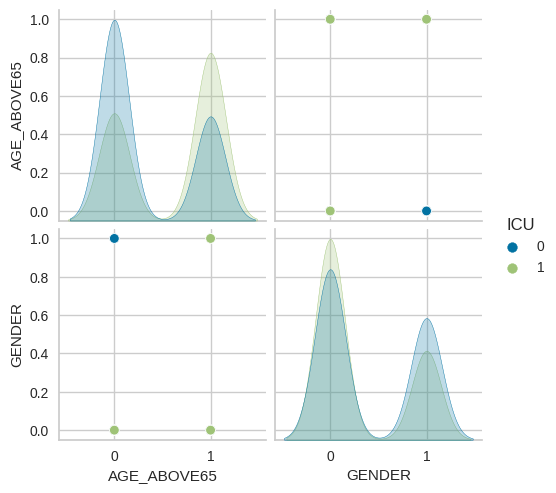

In [40]:
sns.pairplot(covid_icu_df, hue='ICU', vars=['AGE_ABOVE65','GENDER'])

<h2>Vital Signs</h2>

<IPython.core.display.Javascript object>

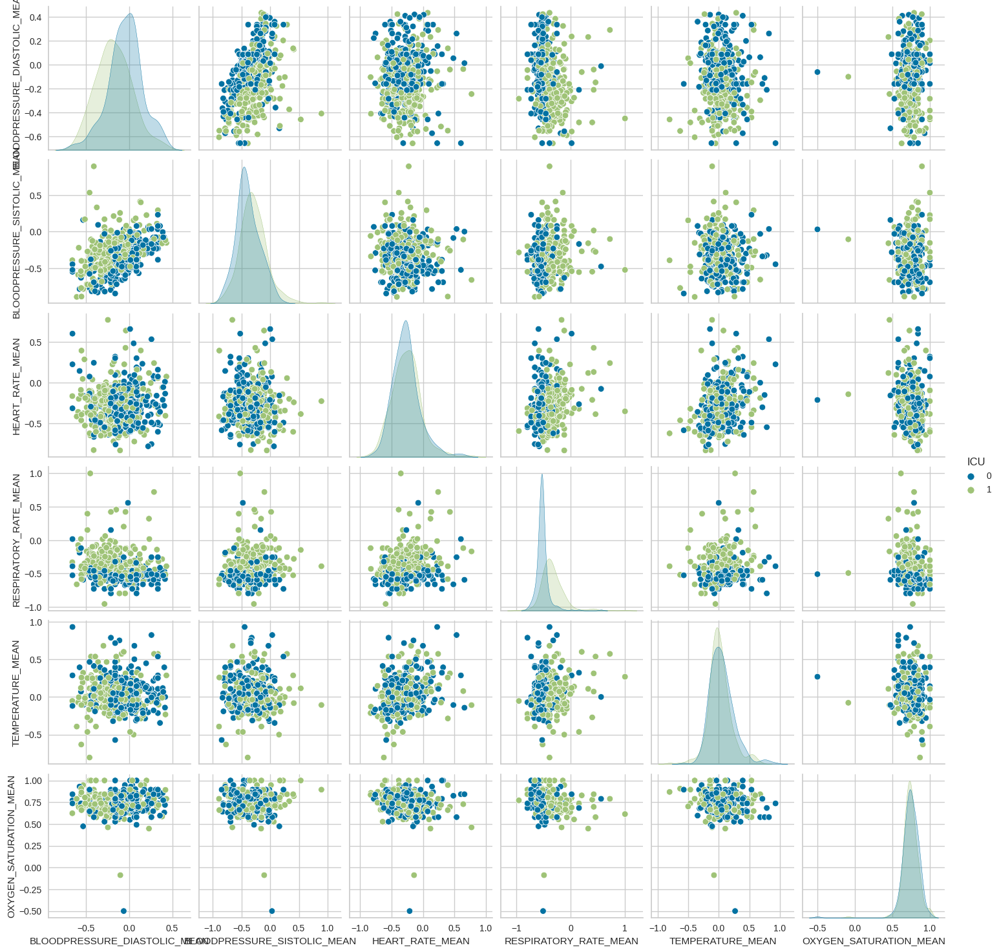

In [41]:
#plot means
sns.pairplot(covid_icu_df, hue='ICU', vars=['BLOODPRESSURE_DIASTOLIC_MEAN','BLOODPRESSURE_SISTOLIC_MEAN','HEART_RATE_MEAN','RESPIRATORY_RATE_MEAN','TEMPERATURE_MEAN','OXYGEN_SATURATION_MEAN'
                                       ])

<IPython.core.display.Javascript object>

<Axes: xlabel='OXYGEN_SATURATION_MEAN', ylabel='TEMPERATURE_MEAN'>

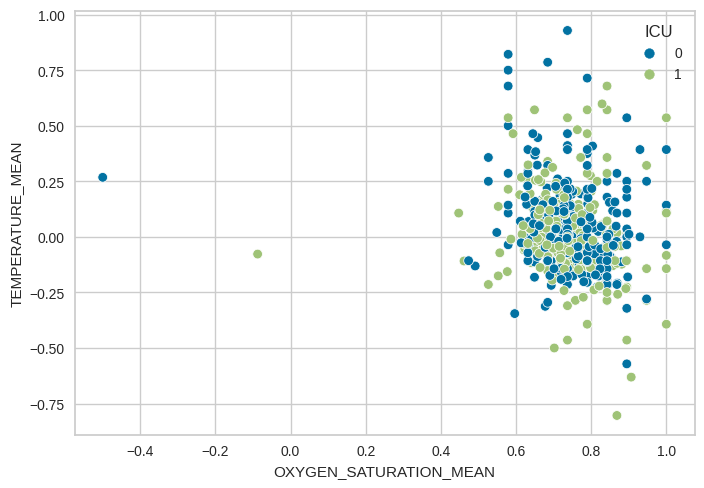

In [42]:
#analyze oxygen saturation and temperature
sns.scatterplot(x= 'OXYGEN_SATURATION_MEAN',y='TEMPERATURE_MEAN',hue='ICU',data = covid_icu_df)

<IPython.core.display.Javascript object>

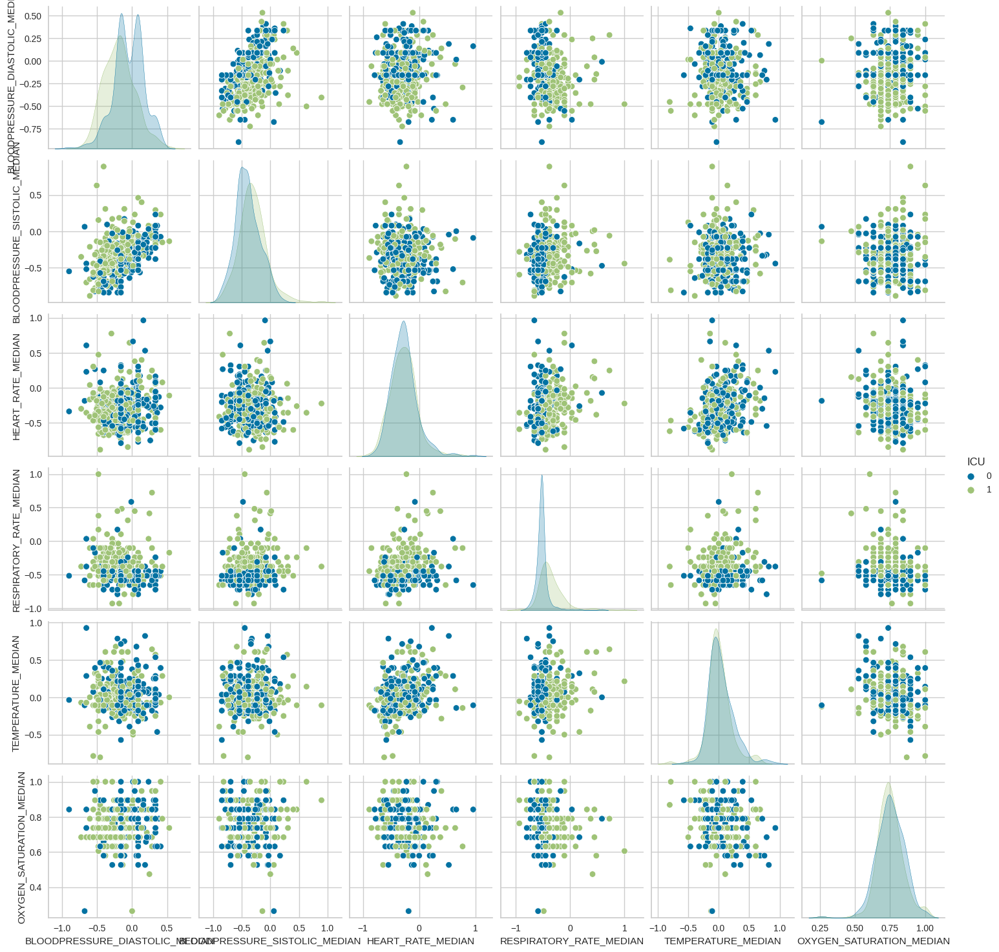

In [43]:
#plot medians
sns.pairplot(covid_icu_df, hue='ICU', vars=['BLOODPRESSURE_DIASTOLIC_MEDIAN','BLOODPRESSURE_SISTOLIC_MEDIAN','HEART_RATE_MEDIAN','RESPIRATORY_RATE_MEDIAN','TEMPERATURE_MEDIAN','OXYGEN_SATURATION_MEDIAN'
])

<IPython.core.display.Javascript object>

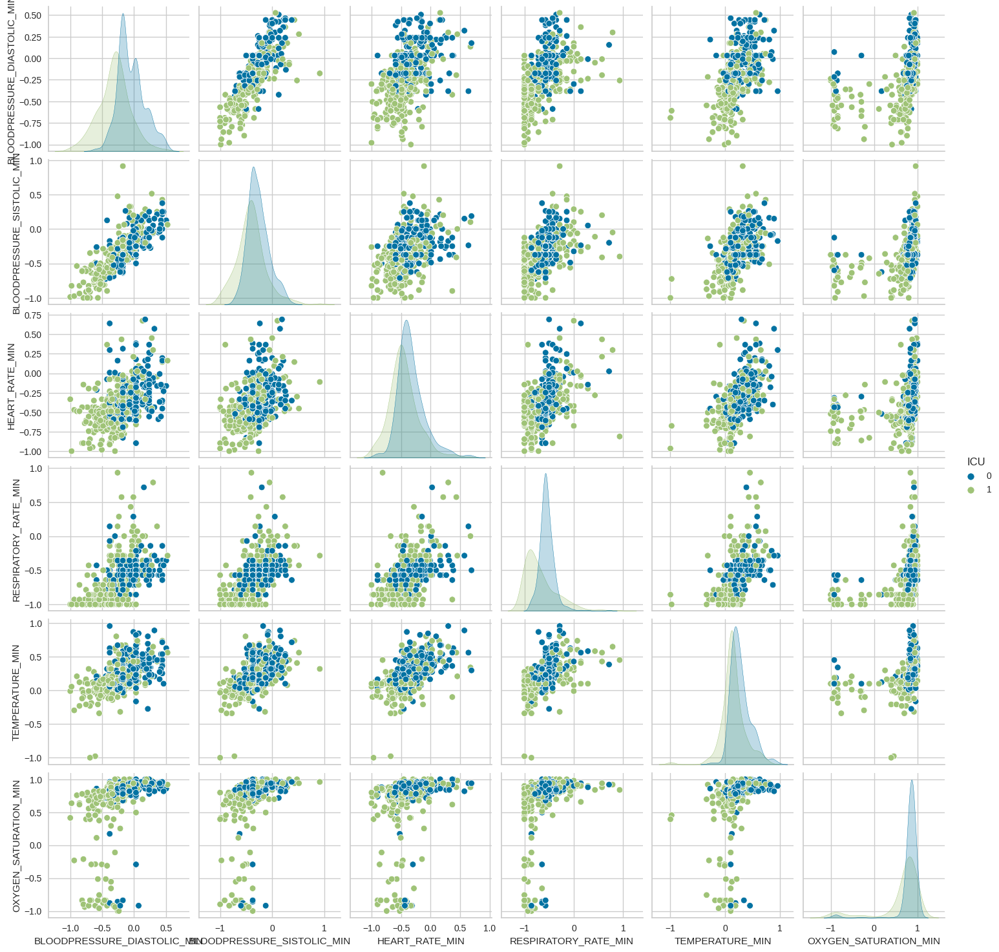

In [44]:
#plot Minimums
sns.pairplot(covid_icu_df, hue='ICU', vars=['BLOODPRESSURE_DIASTOLIC_MIN','BLOODPRESSURE_SISTOLIC_MIN','HEART_RATE_MIN','RESPIRATORY_RATE_MIN','TEMPERATURE_MIN','OXYGEN_SATURATION_MIN'])

<IPython.core.display.Javascript object>

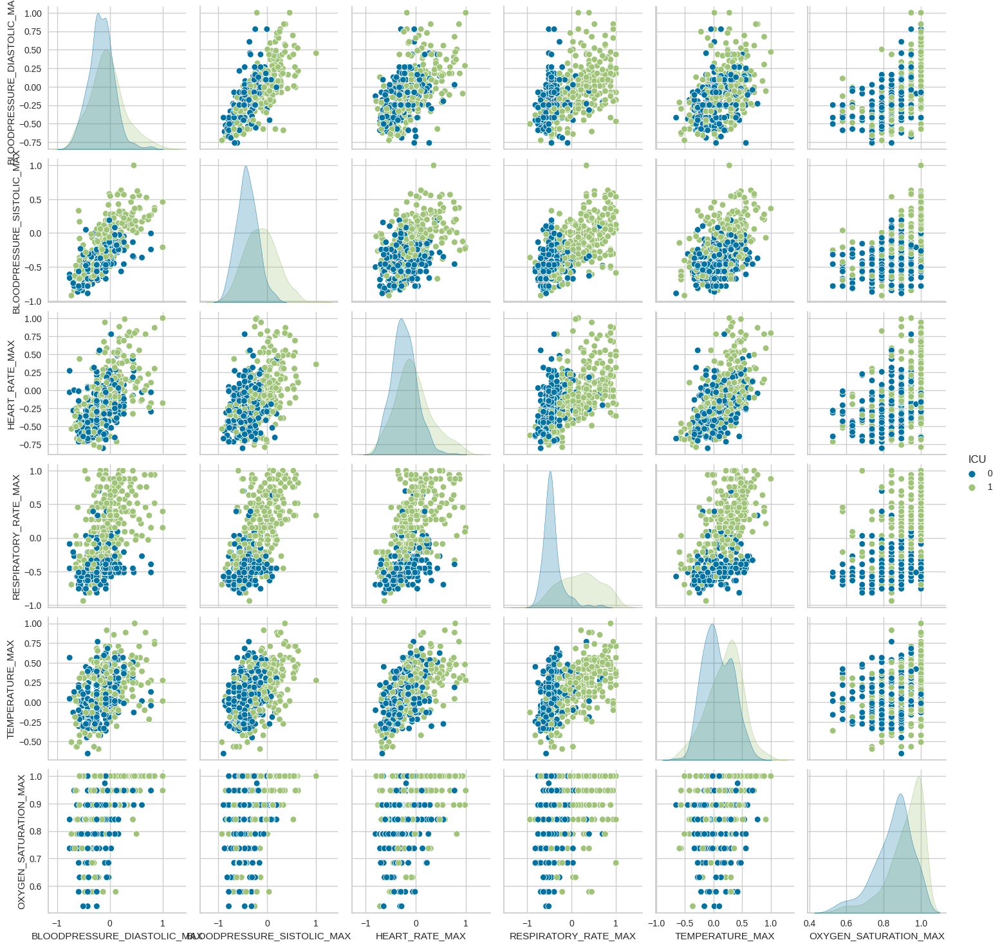

In [45]:
#Plot Maximums
sns.pairplot(covid_icu_df, hue='ICU', vars=['BLOODPRESSURE_DIASTOLIC_MAX','BLOODPRESSURE_SISTOLIC_MAX','HEART_RATE_MAX','RESPIRATORY_RATE_MAX','TEMPERATURE_MAX','OXYGEN_SATURATION_MAX'])

<IPython.core.display.Javascript object>

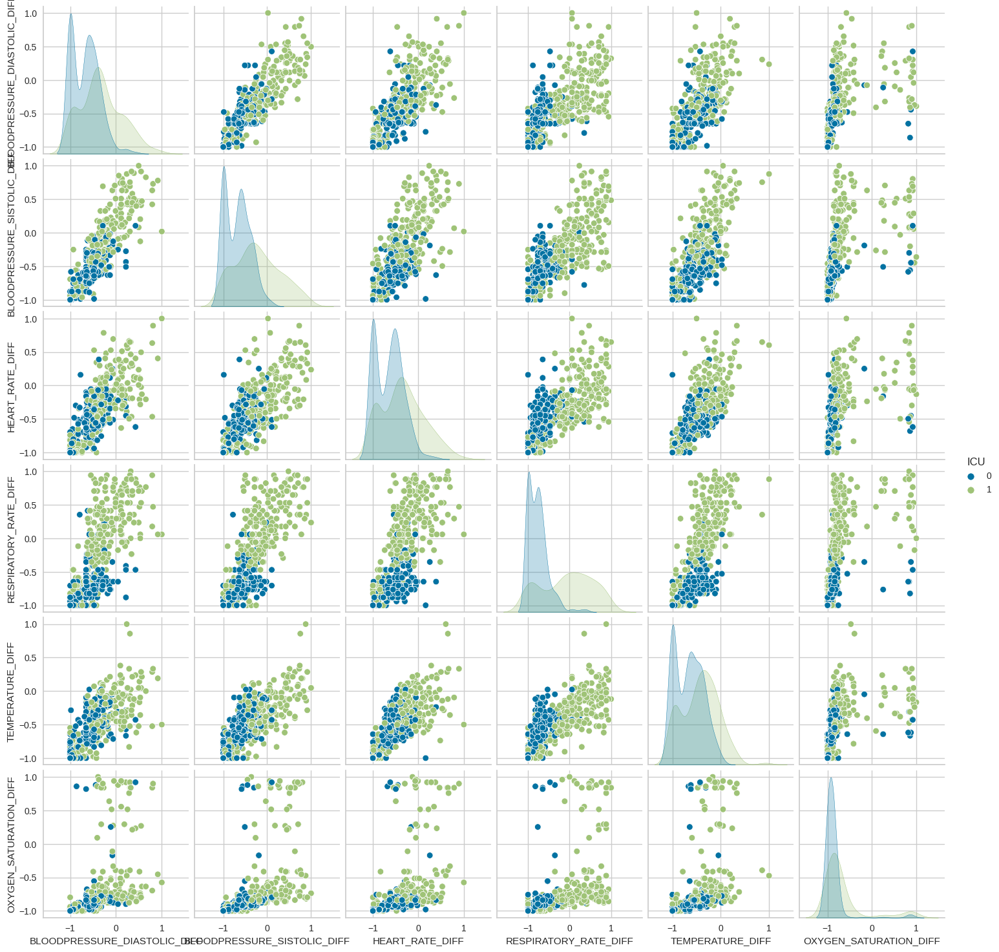

In [46]:
#Plot Differentials (Max-Min)
sns.pairplot(covid_icu_df, hue='ICU', vars=['BLOODPRESSURE_DIASTOLIC_DIFF','BLOODPRESSURE_SISTOLIC_DIFF','HEART_RATE_DIFF','RESPIRATORY_RATE_DIFF','TEMPERATURE_DIFF','OXYGEN_SATURATION_DIFF'])

<IPython.core.display.Javascript object>

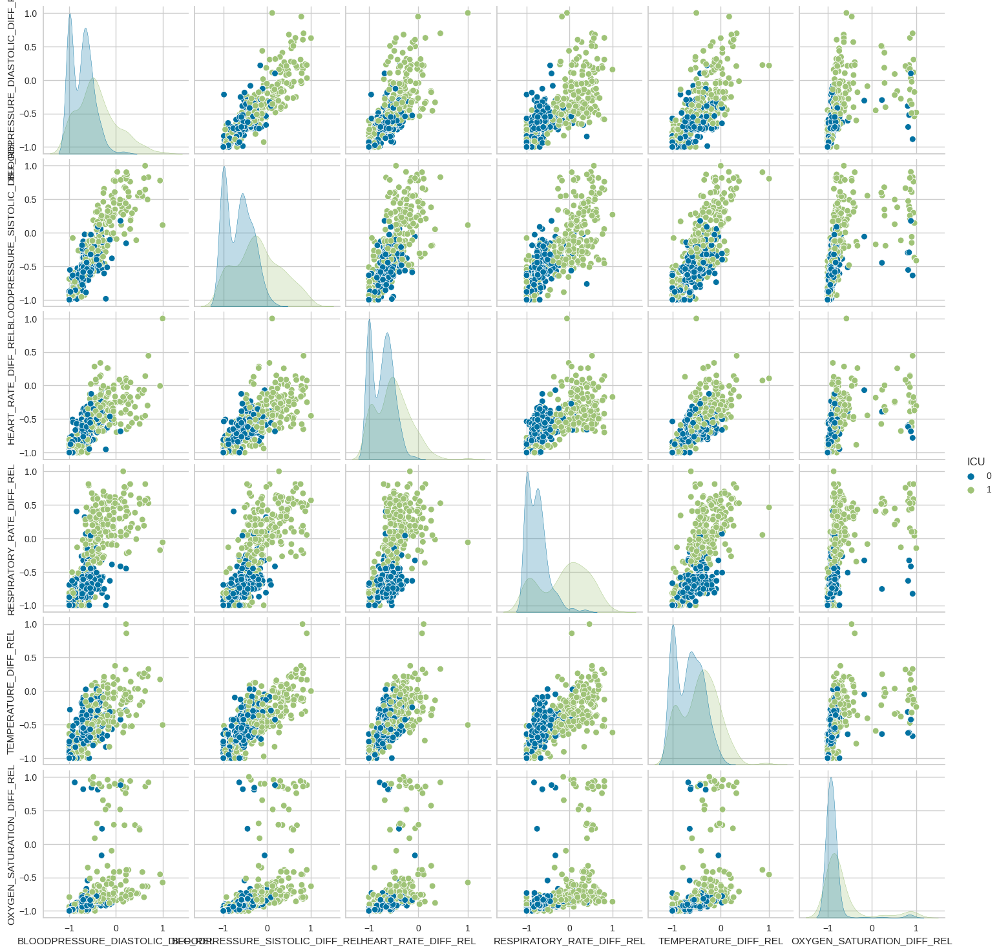

In [47]:
#plot Differential Relatives
sns.pairplot(covid_icu_df, hue='ICU',vars=['BLOODPRESSURE_DIASTOLIC_DIFF_REL','BLOODPRESSURE_SISTOLIC_DIFF_REL','HEART_RATE_DIFF_REL','RESPIRATORY_RATE_DIFF_REL','TEMPERATURE_DIFF_REL','OXYGEN_SATURATION_DIFF_REL'])

### **Analyzing Laboratory Tests**

**Median**

<IPython.core.display.Javascript object>

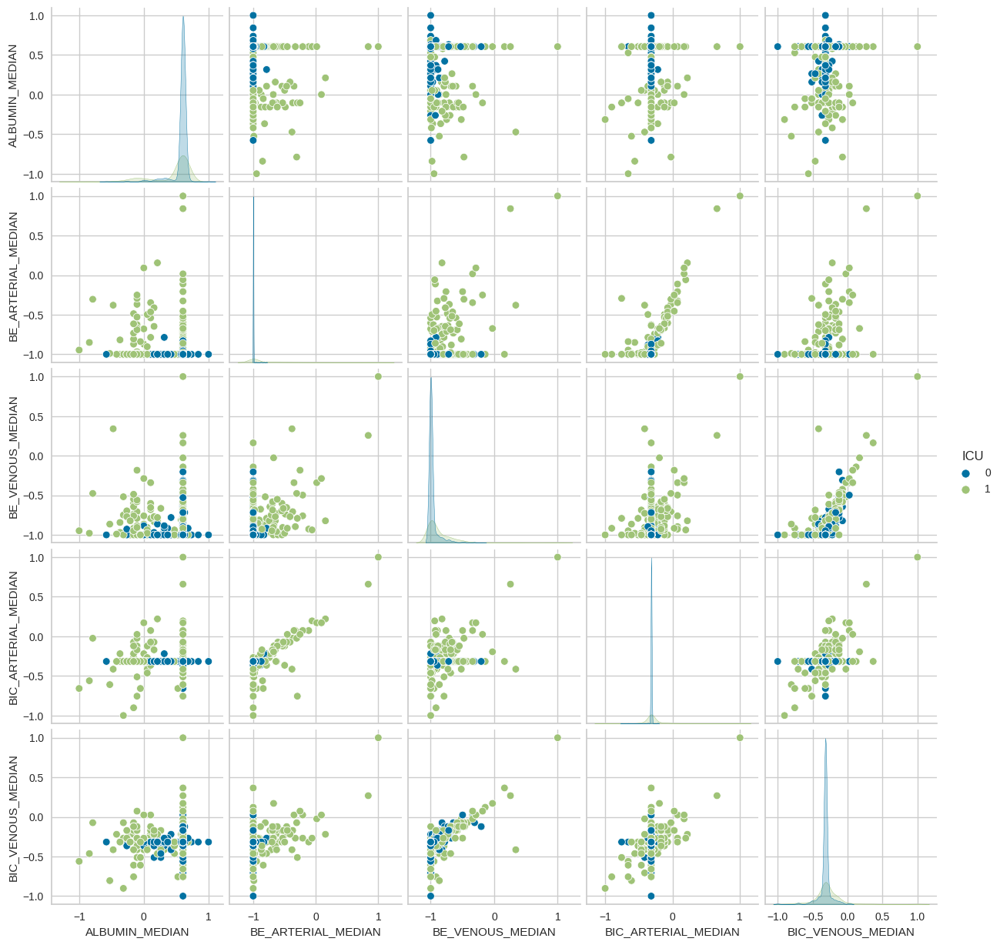

In [49]:
sns.pairplot(covid_data, hue="ICU", vars=['ALBUMIN_MEDIAN','BE_ARTERIAL_MEDIAN','BE_VENOUS_MEDIAN','BIC_ARTERIAL_MEDIAN','BIC_VENOUS_MEDIAN'])


<IPython.core.display.Javascript object>

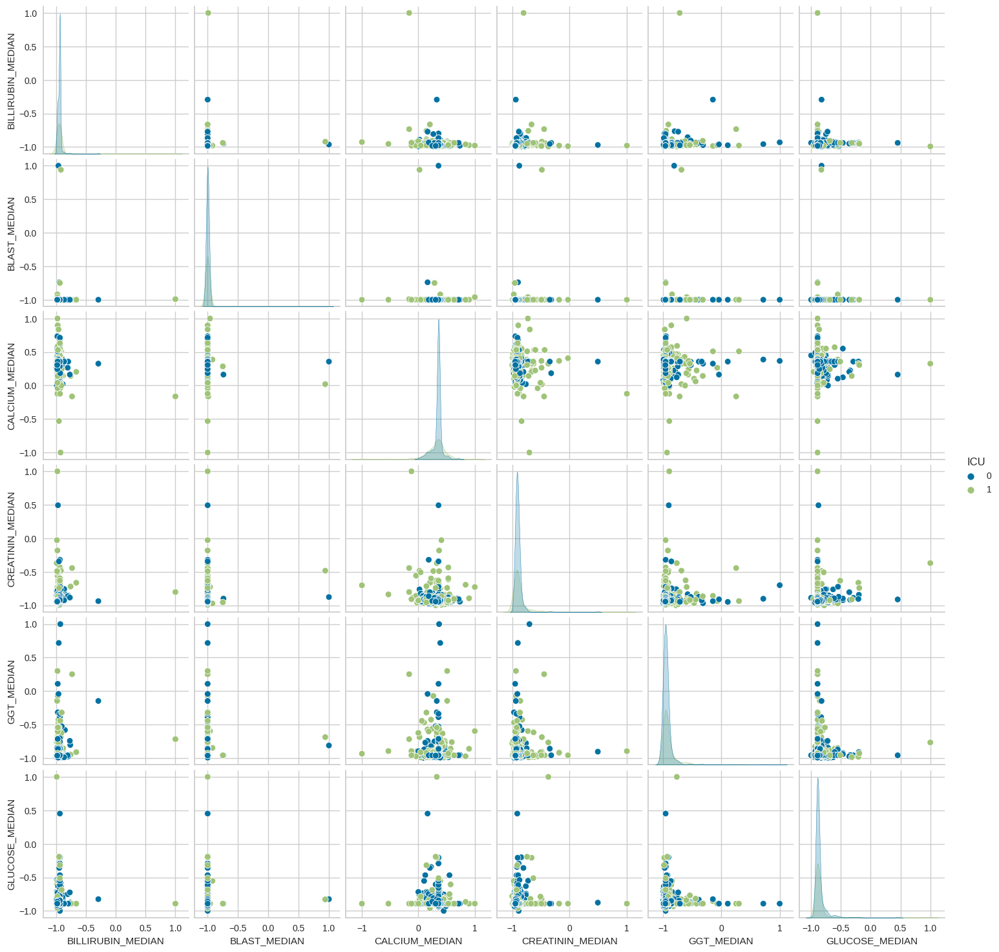

In [50]:
sns.pairplot(covid_data, hue="ICU", vars=['BILLIRUBIN_MEDIAN','BLAST_MEDIAN','CALCIUM_MEDIAN','CREATININ_MEDIAN','GGT_MEDIAN','GLUCOSE_MEDIAN'])

<IPython.core.display.Javascript object>

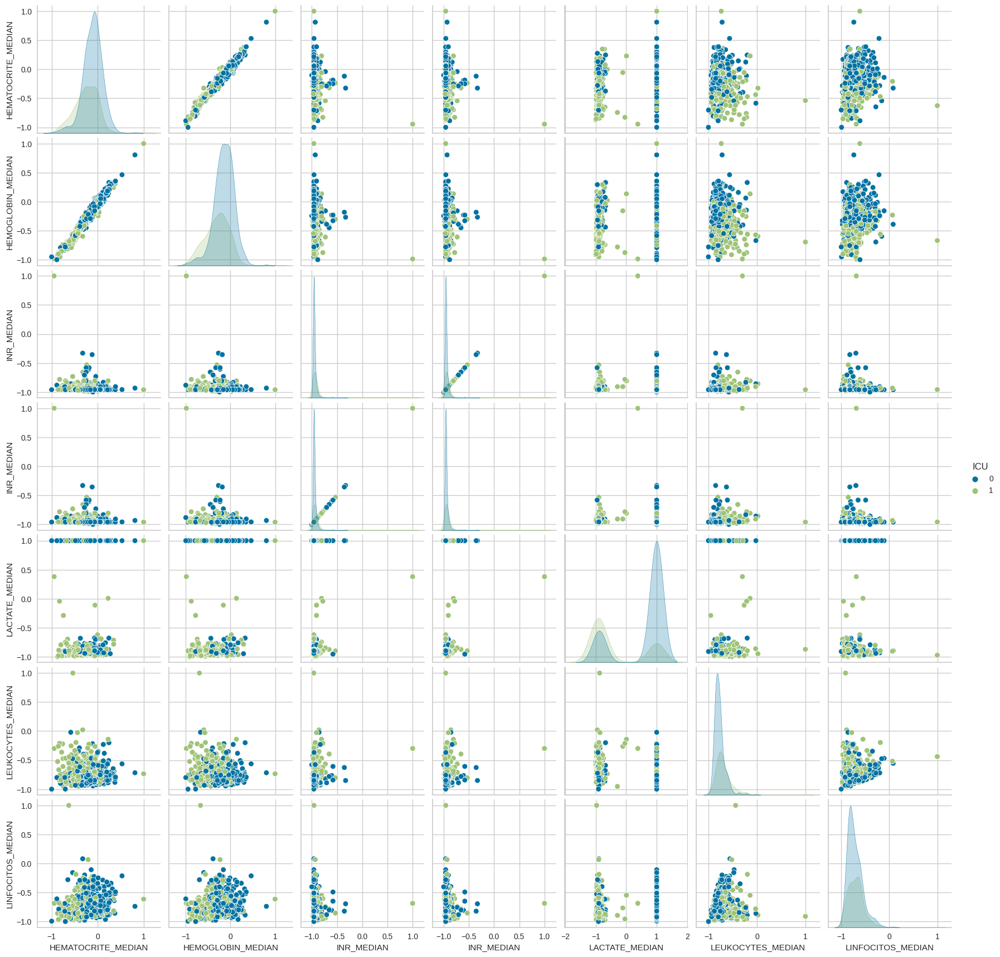

In [51]:
sns.pairplot(covid_data, hue="ICU", vars=['HEMATOCRITE_MEDIAN','HEMOGLOBIN_MEDIAN','INR_MEDIAN','INR_MEDIAN','LACTATE_MEDIAN','LEUKOCYTES_MEDIAN','LINFOCITOS_MEDIAN'])

<IPython.core.display.Javascript object>

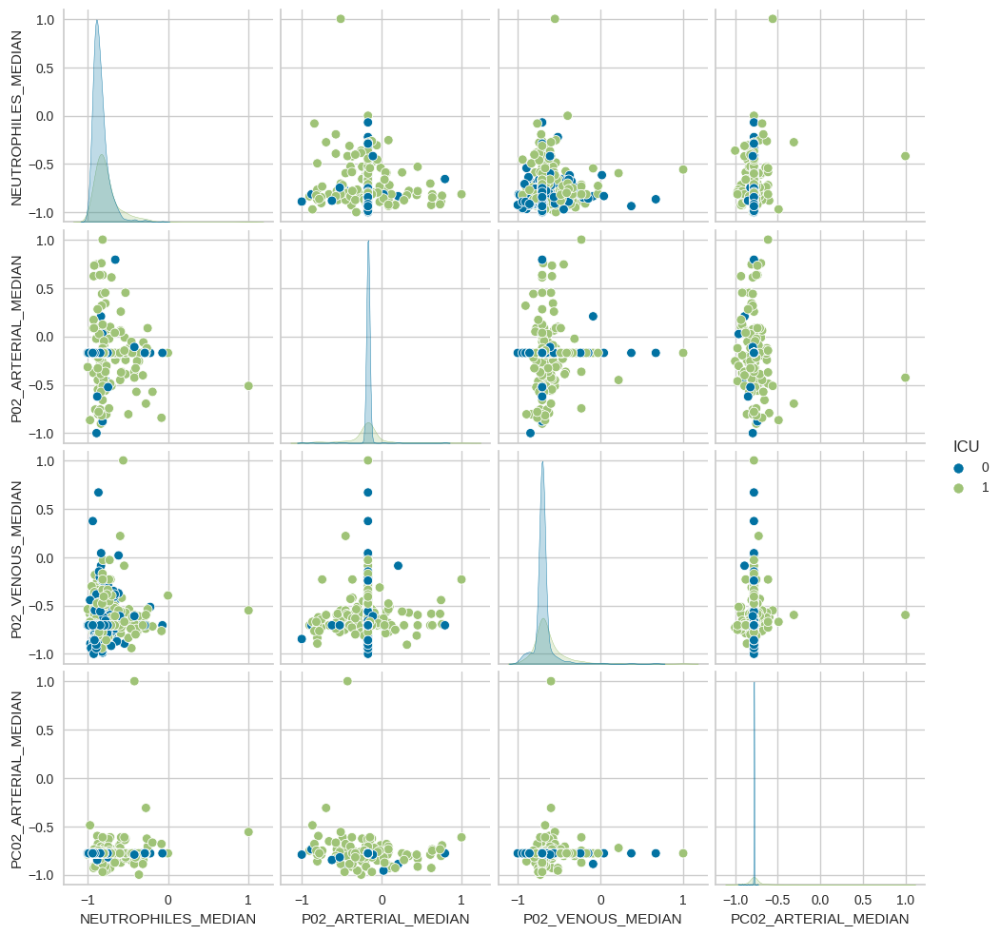

In [53]:
sns.pairplot(covid_data, hue="ICU", vars=['NEUTROPHILES_MEDIAN','P02_ARTERIAL_MEDIAN','P02_VENOUS_MEDIAN','PC02_ARTERIAL_MEDIAN'])

<IPython.core.display.Javascript object>

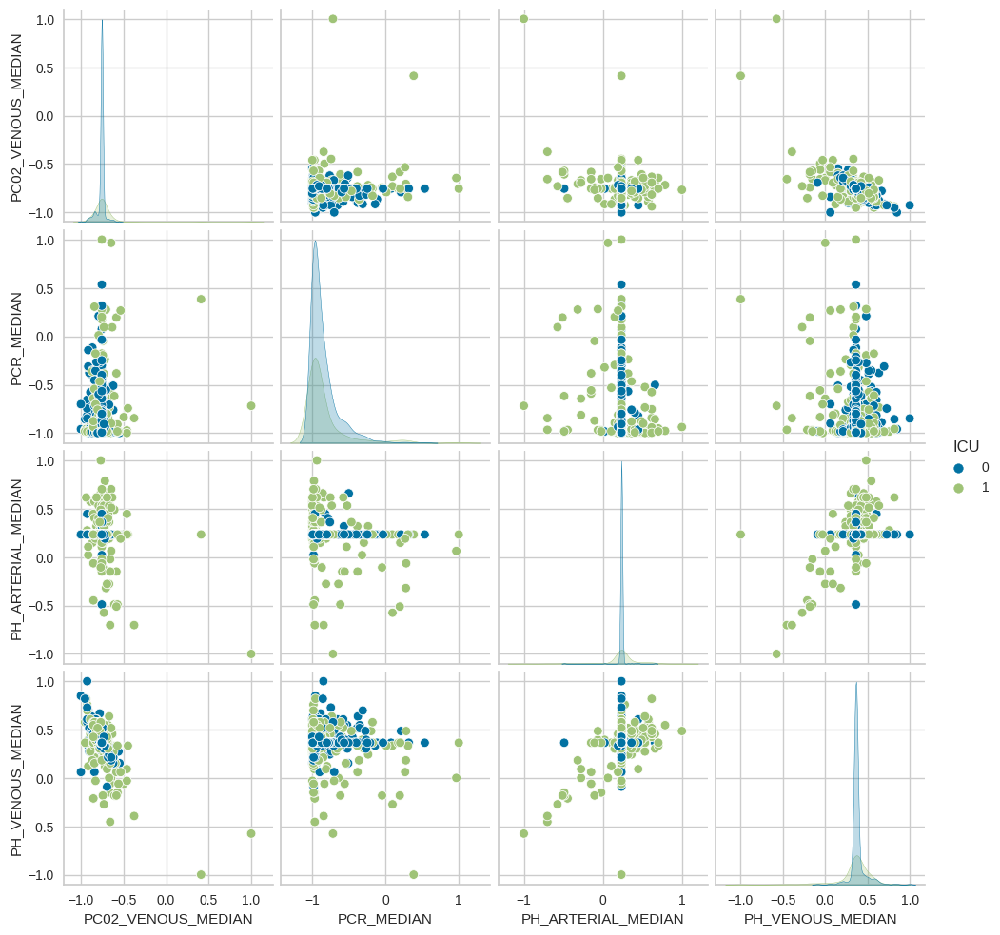

In [55]:
sns.pairplot(covid_data, hue="ICU", vars=['PC02_VENOUS_MEDIAN','PCR_MEDIAN','PH_ARTERIAL_MEDIAN','PH_VENOUS_MEDIAN'])

<IPython.core.display.Javascript object>

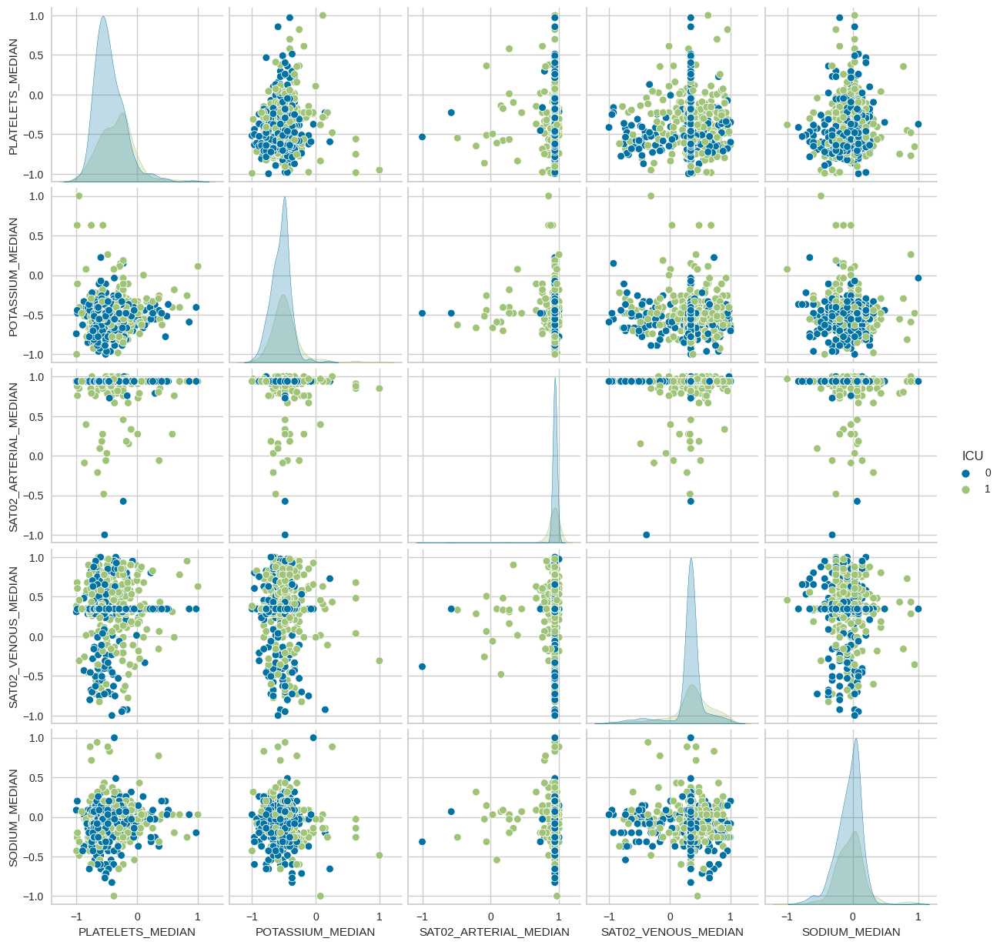

In [56]:
sns.pairplot(covid_data, hue="ICU", vars=['PLATELETS_MEDIAN','POTASSIUM_MEDIAN','SAT02_ARTERIAL_MEDIAN','SAT02_VENOUS_MEDIAN','SODIUM_MEDIAN'])

**Minimum**

<IPython.core.display.Javascript object>

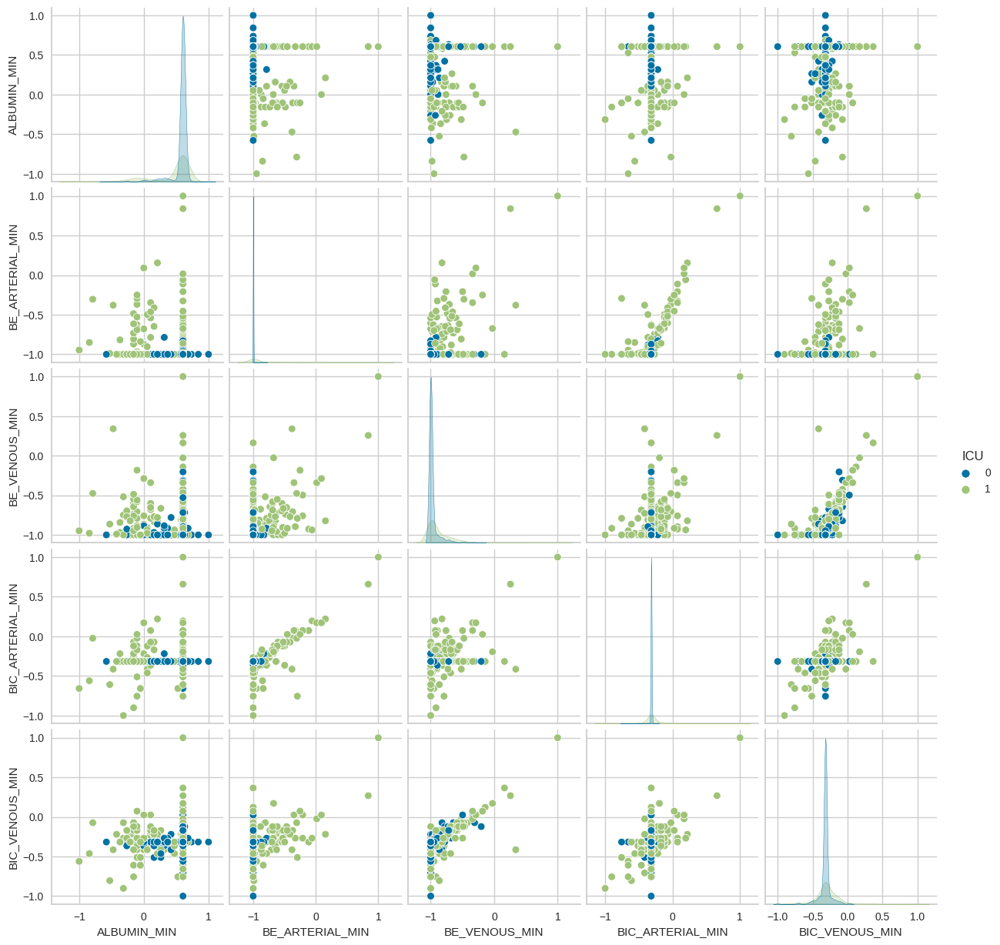

In [52]:
sns.pairplot(covid_data, hue="ICU", vars=['ALBUMIN_MIN','BE_ARTERIAL_MIN','BE_VENOUS_MIN','BIC_ARTERIAL_MIN','BIC_VENOUS_MIN'])

<IPython.core.display.Javascript object>

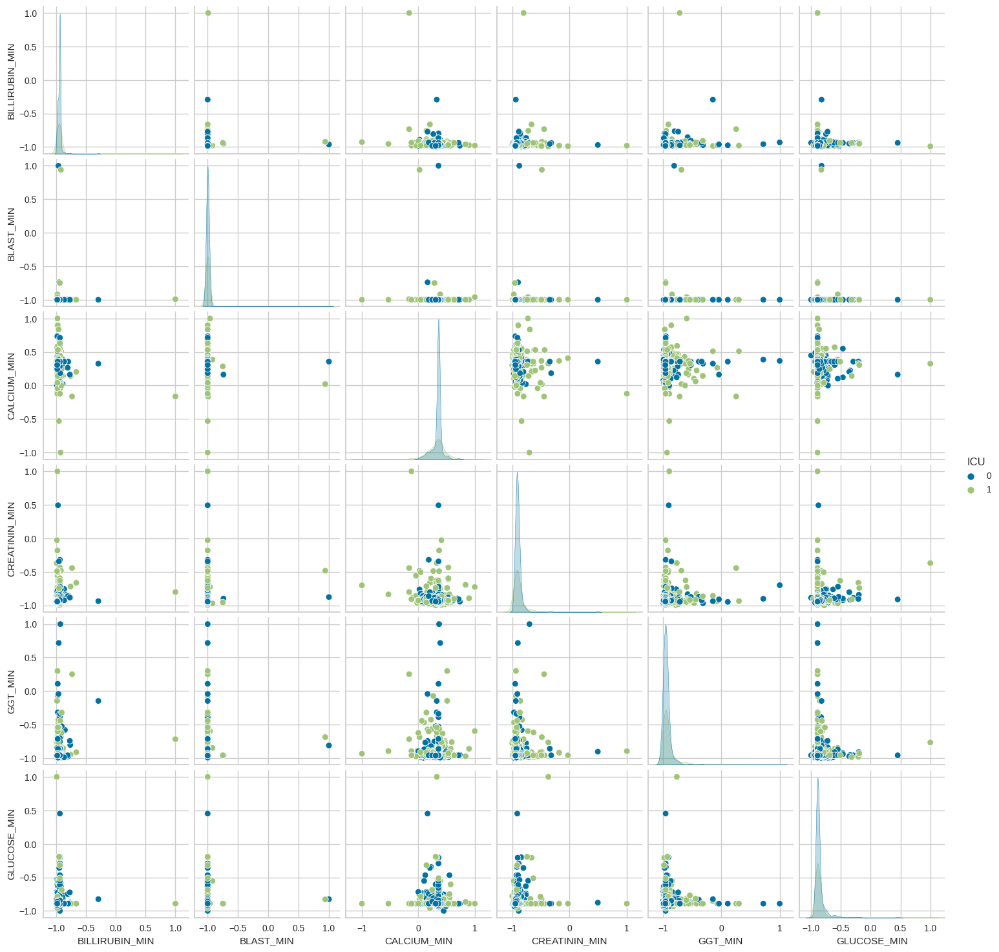

In [57]:
sns.pairplot(covid_data, hue="ICU", vars=['BILLIRUBIN_MIN','BLAST_MIN','CALCIUM_MIN','CREATININ_MIN','GGT_MIN','GLUCOSE_MIN'])

<IPython.core.display.Javascript object>

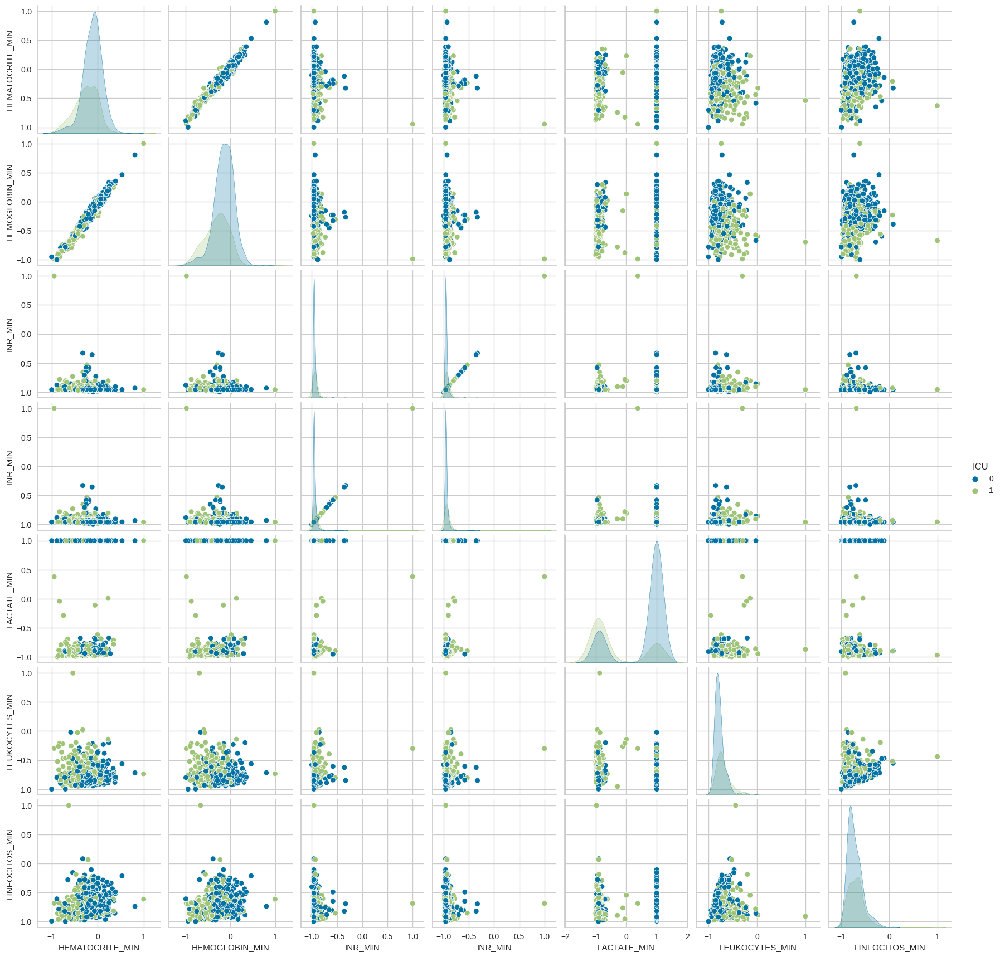

In [58]:
sns.pairplot(covid_data, hue="ICU", vars=['HEMATOCRITE_MIN','HEMOGLOBIN_MIN','INR_MIN','INR_MIN','LACTATE_MIN','LEUKOCYTES_MIN','LINFOCITOS_MIN'])

<IPython.core.display.Javascript object>

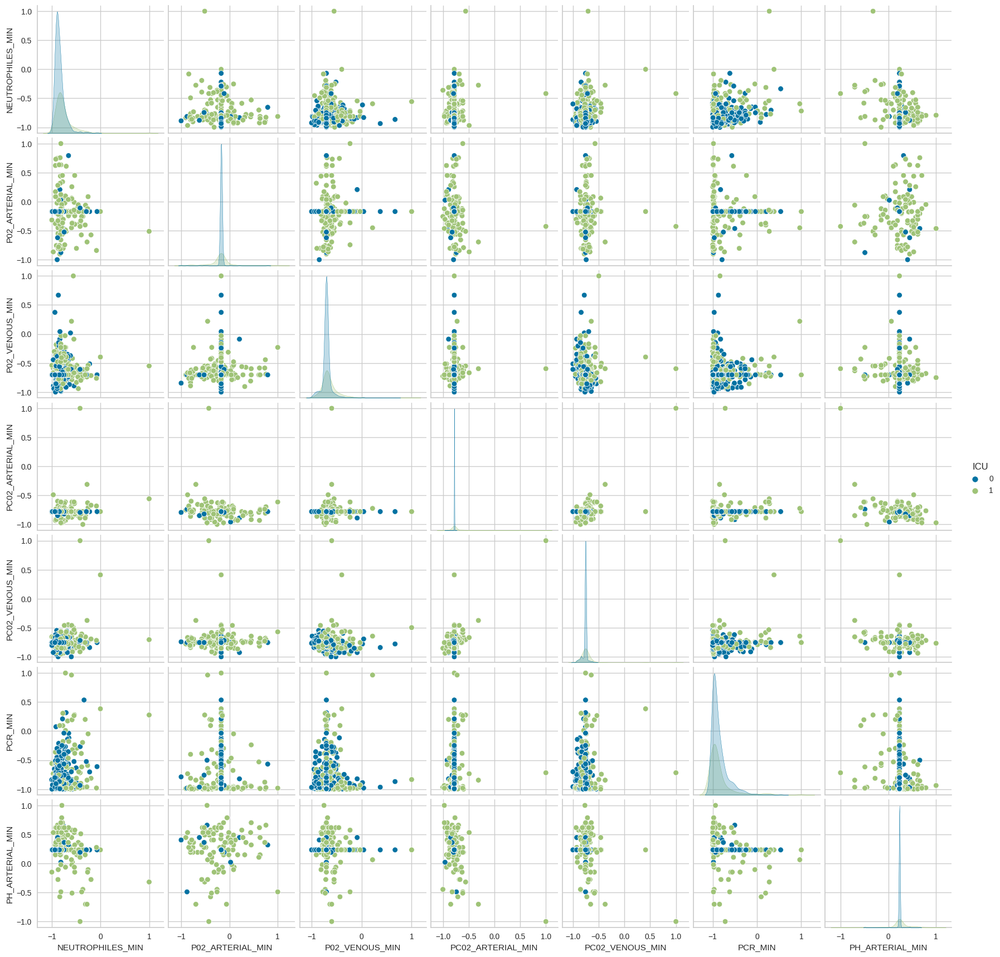

In [59]:
sns.pairplot(covid_data, hue="ICU", vars=['NEUTROPHILES_MIN','P02_ARTERIAL_MIN','P02_VENOUS_MIN','PC02_ARTERIAL_MIN','PC02_VENOUS_MIN','PCR_MIN','PH_ARTERIAL_MIN'])

<IPython.core.display.Javascript object>

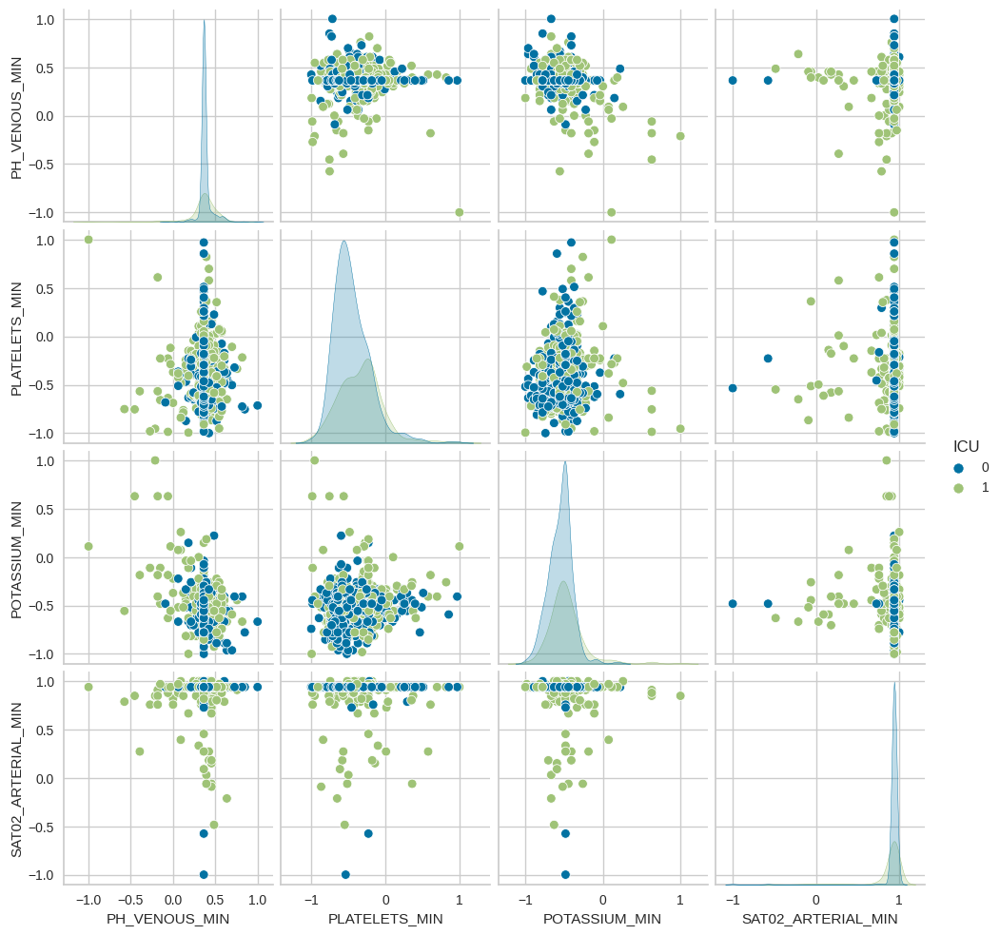

In [61]:
sns.pairplot(covid_data, hue="ICU", vars=['PH_VENOUS_MIN','PLATELETS_MIN','POTASSIUM_MIN','SAT02_ARTERIAL_MIN'])

<IPython.core.display.Javascript object>

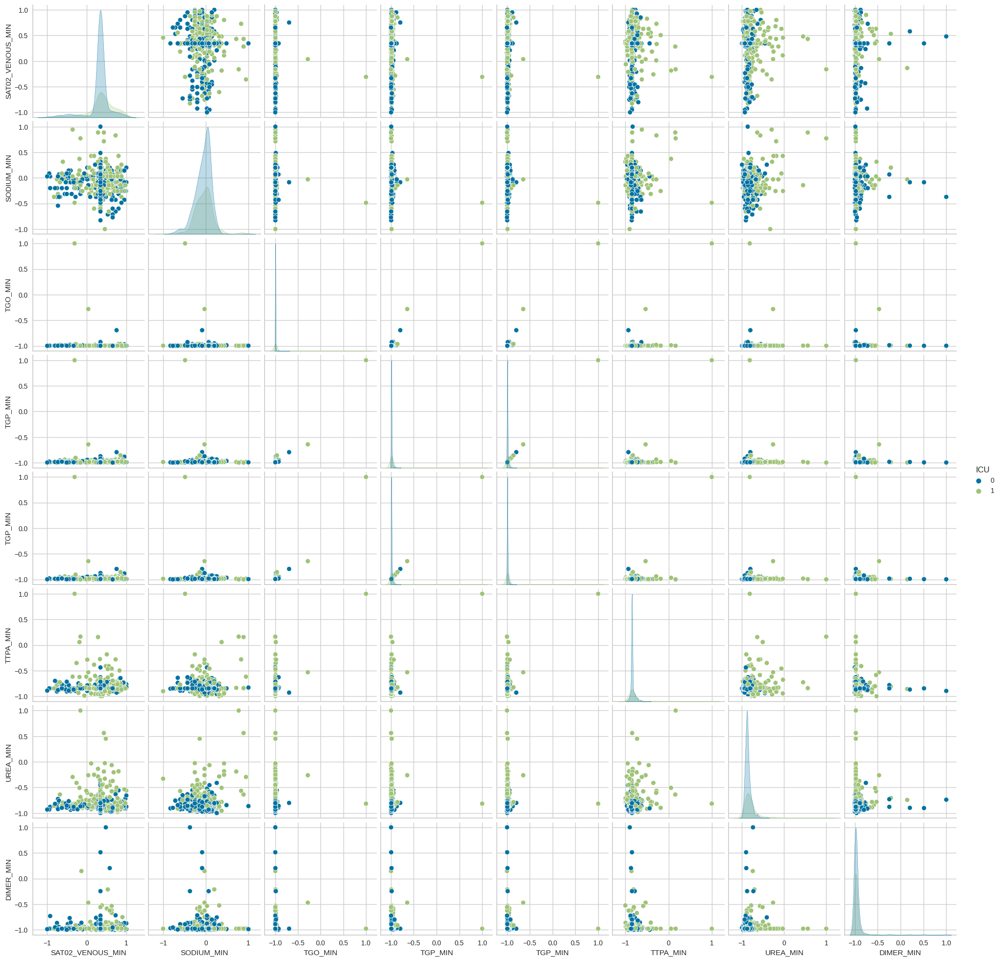

In [62]:
sns.pairplot(covid_data, hue="ICU", vars=['SAT02_VENOUS_MIN','SODIUM_MIN','TGO_MIN','TGP_MIN','TGP_MIN','TTPA_MIN','UREA_MIN','DIMER_MIN'])

**Maximum**

<IPython.core.display.Javascript object>

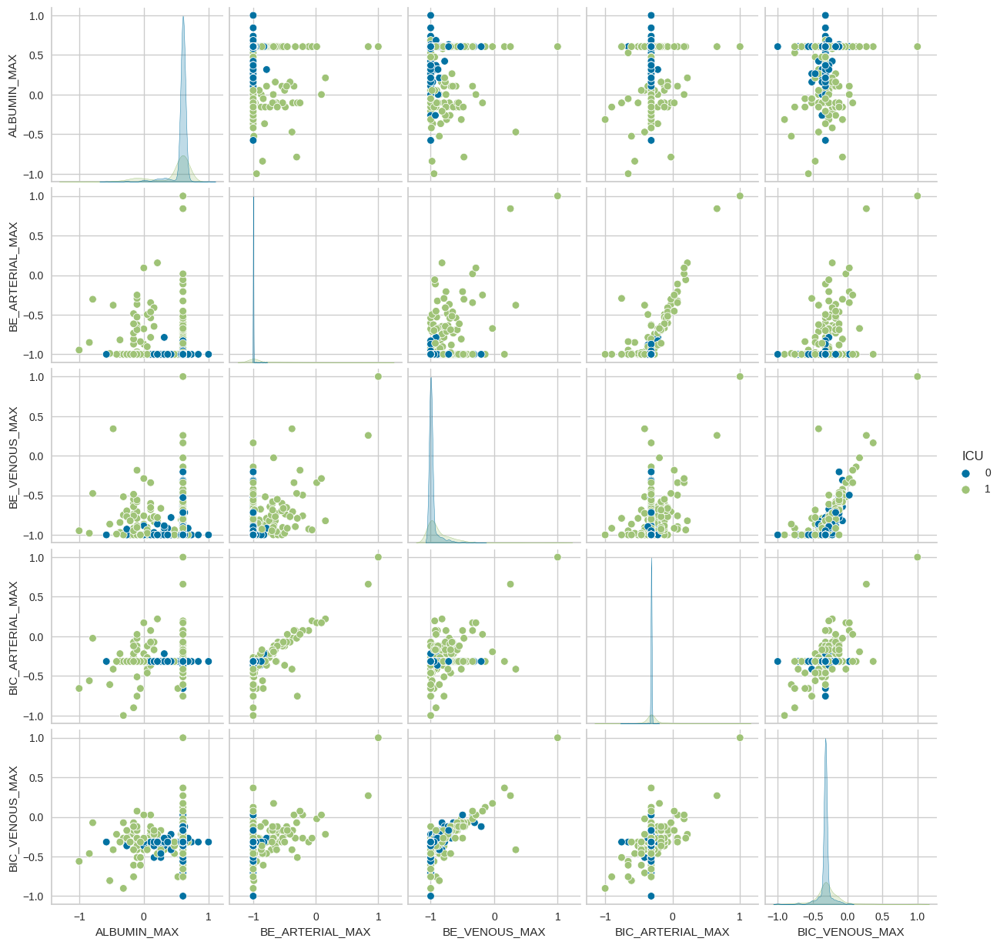

In [63]:
sns.pairplot(covid_data, hue="ICU", vars=['ALBUMIN_MAX','BE_ARTERIAL_MAX','BE_VENOUS_MAX','BIC_ARTERIAL_MAX','BIC_VENOUS_MAX'])

<IPython.core.display.Javascript object>

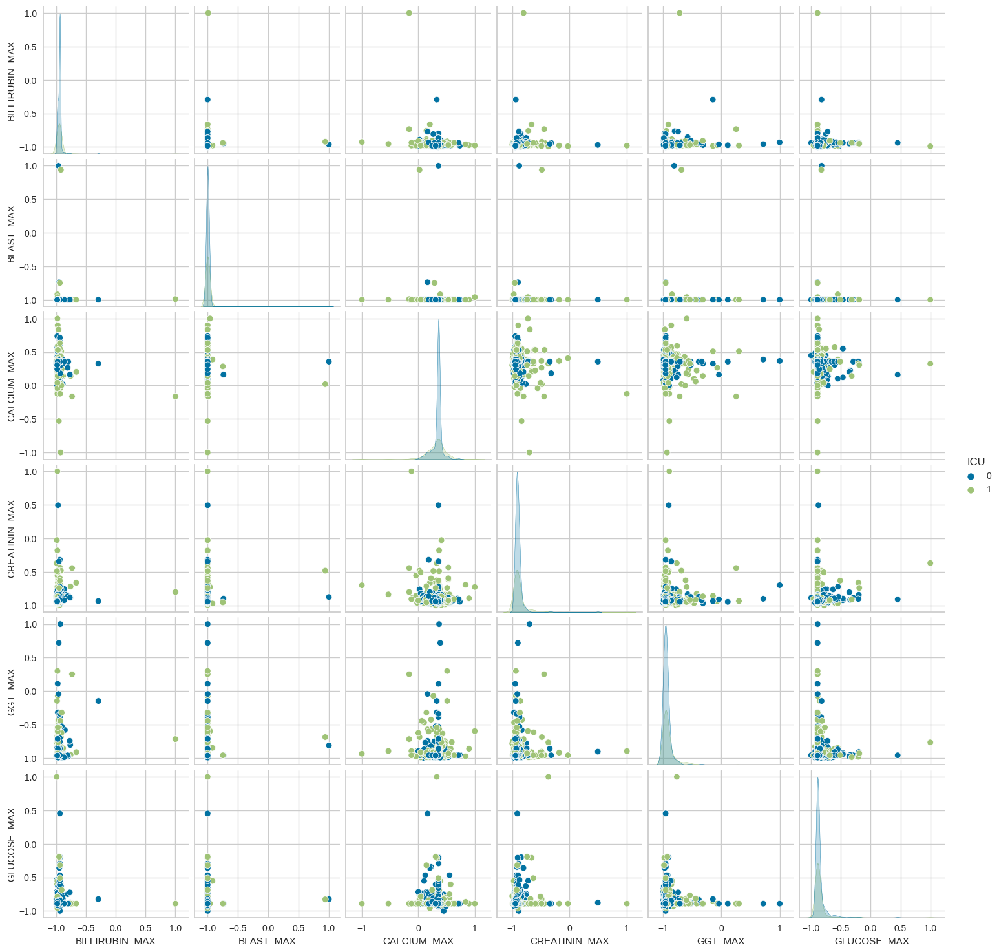

In [64]:
sns.pairplot(covid_data, hue="ICU", vars=['BILLIRUBIN_MAX','BLAST_MAX','CALCIUM_MAX','CREATININ_MAX','GGT_MAX','GLUCOSE_MAX'])

<IPython.core.display.Javascript object>

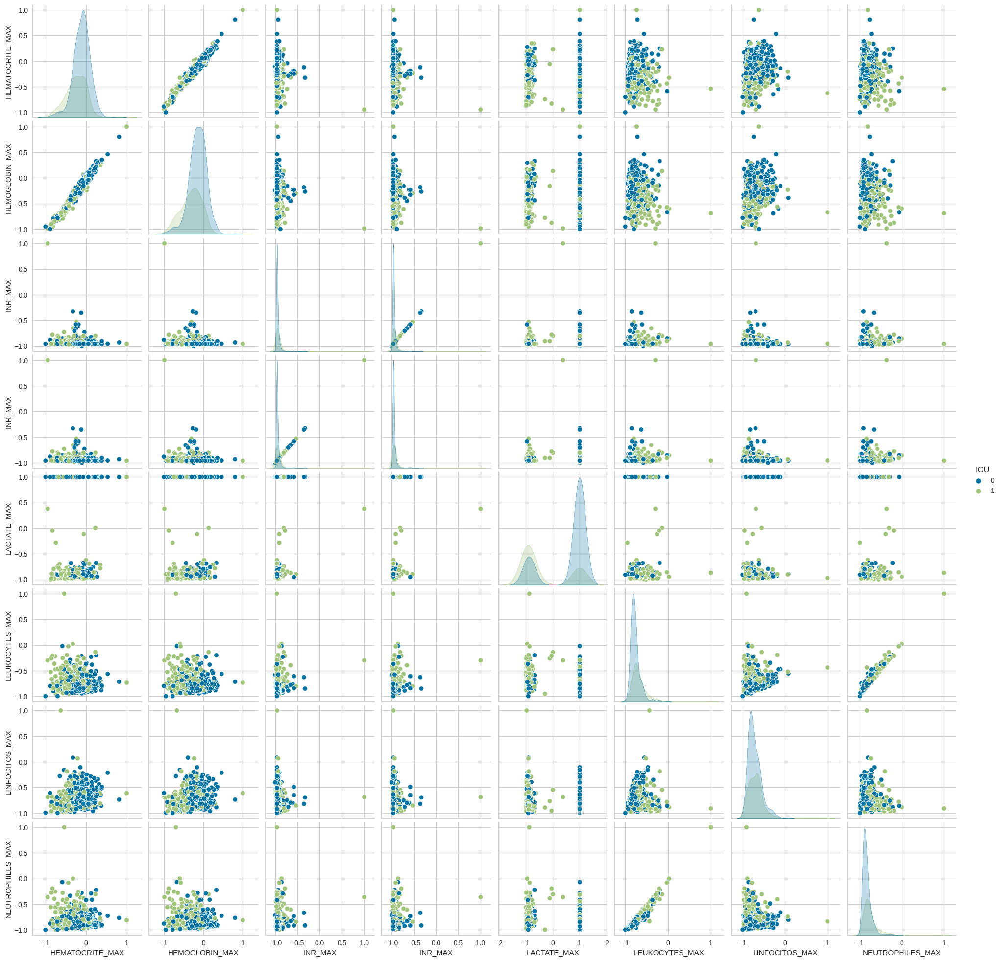

In [65]:
sns.pairplot(covid_data, hue="ICU", vars=['HEMATOCRITE_MAX','HEMOGLOBIN_MAX','INR_MAX','INR_MAX','LACTATE_MAX','LEUKOCYTES_MAX','LINFOCITOS_MAX','NEUTROPHILES_MAX'])

<IPython.core.display.Javascript object>

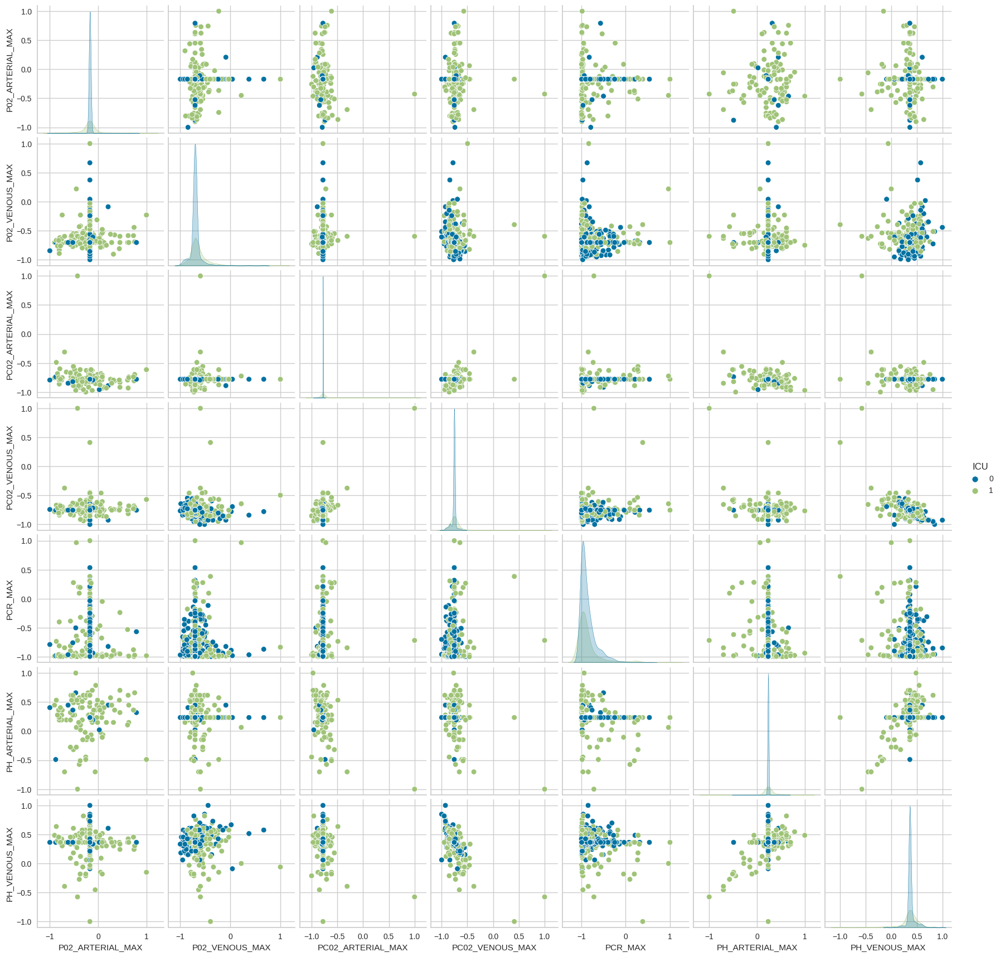

In [66]:
sns.pairplot(covid_data, hue="ICU", vars=['P02_ARTERIAL_MAX','P02_VENOUS_MAX','PC02_ARTERIAL_MAX','PC02_VENOUS_MAX','PCR_MAX','PH_ARTERIAL_MAX','PH_VENOUS_MAX'])

<IPython.core.display.Javascript object>

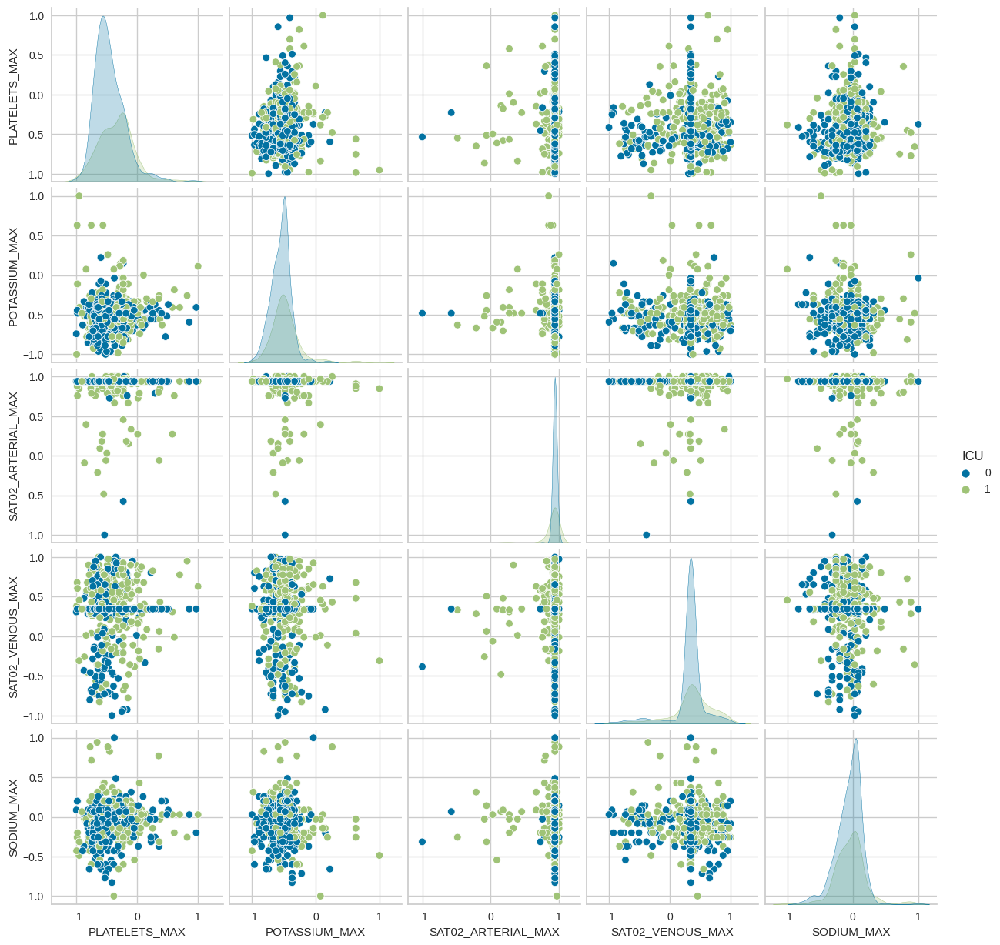

In [67]:
sns.pairplot(covid_data, hue="ICU", vars=['PLATELETS_MAX','POTASSIUM_MAX','SAT02_ARTERIAL_MAX','SAT02_VENOUS_MAX','SODIUM_MAX'])


<IPython.core.display.Javascript object>

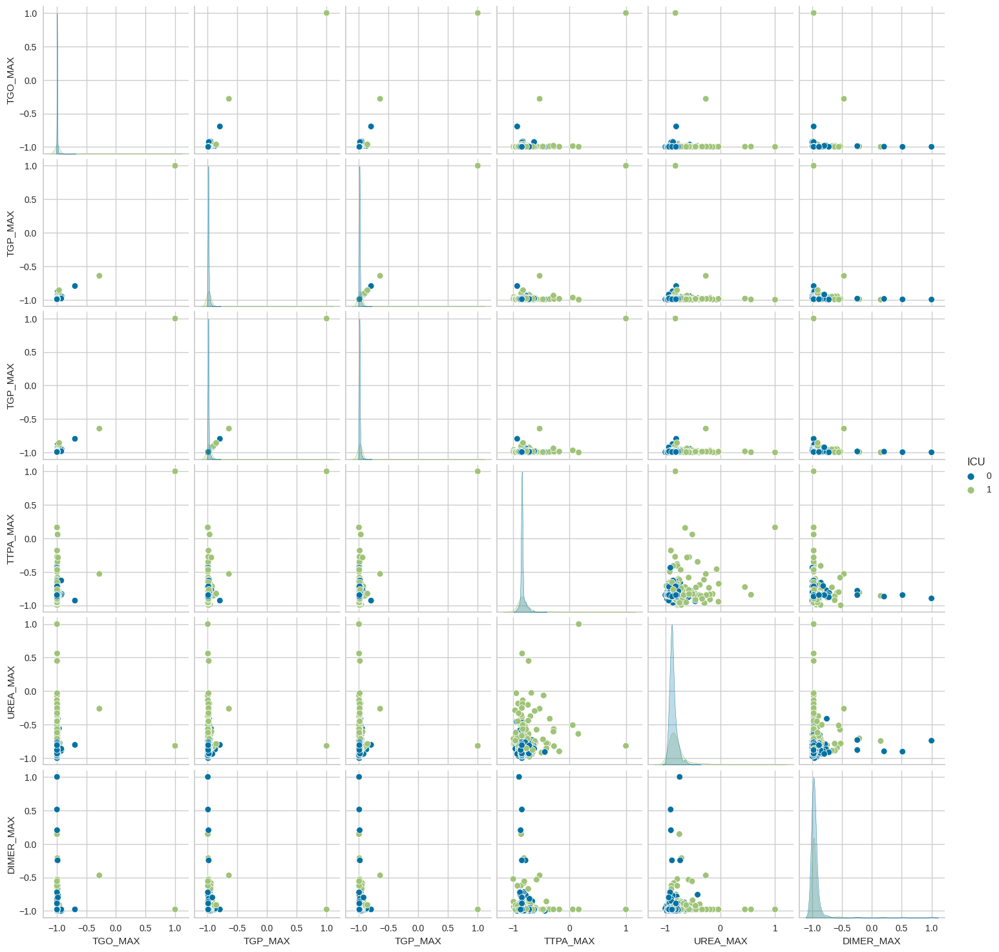

In [68]:
sns.pairplot(covid_data, hue="ICU", vars=['TGO_MAX','TGP_MAX','TGP_MAX','TTPA_MAX','UREA_MAX','DIMER_MAX'])

In [118]:
#create an indepenent variable X
X = covid_icu_df.drop(["ICU"],axis=1)

<IPython.core.display.Javascript object>

In [119]:
#create dependant variable y
y = covid_icu_df['ICU']

<IPython.core.display.Javascript object>

In [120]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=5)

<IPython.core.display.Javascript object>

In [121]:
X_train.head()

<IPython.core.display.Javascript object>

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,...,PCR_MEAN,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,AGE_PERCENTIL_10th,AGE_PERCENTIL_20th,AGE_PERCENTIL_30th,AGE_PERCENTIL_40th,AGE_PERCENTIL_50th,AGE_PERCENTIL_60th,AGE_PERCENTIL_70th,AGE_PERCENTIL_80th,AGE_PERCENTIL_90th,AGE_PERCENTIL_Above 90th,WINDOW_0-2,WINDOW_2-4,WINDOW_4-6,WINDOW_6-12,WINDOW_ABOVE_12
119,23,0,1,0,0,0,0,0,0,0.000,0.000,1.000,0.605,0.605,0.605,0.605,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000,-0.317,-0.317,-0.317,-0.317,-1.000,-0.317,-0.317,-0.317,-0.317,-1.000,-0.990,-0.990,-0.990,-0.990,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000,0.357,0.357,0.357,0.357,-1.000,-0.960,-0.960,-0.960,-0.960,-1.000,-0.872,-0.872,-0.872,-0.872,-1.000,-0.968,

In [122]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

<IPython.core.display.Javascript object>

In [123]:
svc_model = SVC()

<IPython.core.display.Javascript object>

In [124]:
#fit model to training dataset
svc_model.fit(X_train,y_train)

<IPython.core.display.Javascript object>

SVC()

In [125]:
#predict model using test dataset
y_pred = svc_model.predict(X_test)

<IPython.core.display.Javascript object>

In [127]:
#confusion matrx
cm = confusion_matrix(y_test,y_pred)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Axes: >

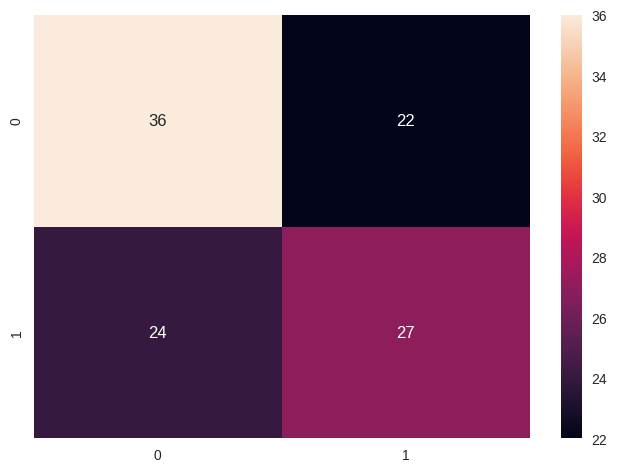

In [128]:
#visialize the matrix
sns.heatmap(cm, annot=True)

<IPython.core.display.Javascript object>

<Axes: xlabel='OXYGEN_SATURATION_MEAN', ylabel='TEMPERATURE_MEAN'>

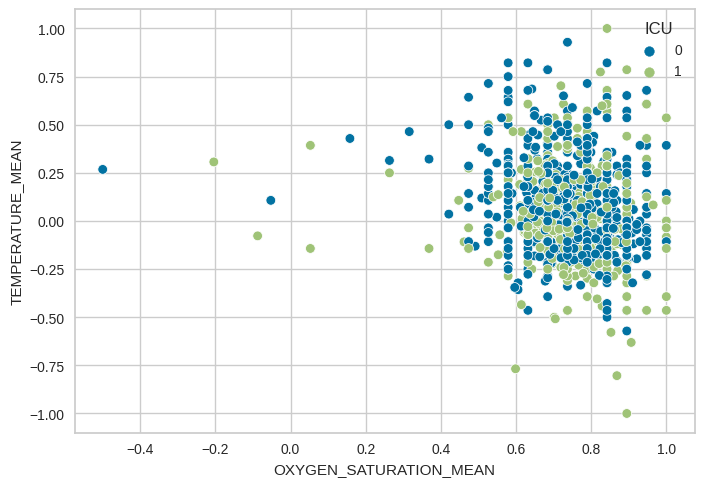

In [129]:
#analyze oxygen saturation and temperature (data was already normalized)
sns.scatterplot(x= 'OXYGEN_SATURATION_MEAN',y='TEMPERATURE_MEAN',hue='ICU',data = covid_data)

In [130]:
print(classification_report(y_test,y_pred))

<IPython.core.display.Javascript object>

              precision    recall  f1-score   support

           0       0.60      0.62      0.61        58
           1       0.55      0.53      0.54        51

    accuracy                           0.58       109
   macro avg       0.58      0.58      0.58       109
weighted avg       0.58      0.58      0.58       109



##**PCA Visualization**

In [131]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

<IPython.core.display.Javascript object>

In [132]:
scaler.fit(covid_icu_df)

<IPython.core.display.Javascript object>

StandardScaler()

In [133]:
scaled_data = scaler.transform(covid_icu_df)

<IPython.core.display.Javascript object>

In [134]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 6)
pca.fit(scaled_data)

<IPython.core.display.Javascript object>

PCA(n_components=6)

In [135]:
x_pca = pca.transform(scaled_data)

<IPython.core.display.Javascript object>

In [136]:
scaled_data.shape

<IPython.core.display.Javascript object>

(545, 244)

In [138]:
x_pca.shape

<IPython.core.display.Javascript object>

(545, 6)

<IPython.core.display.Javascript object>

Text(0, 0.5, 'Second Principal Component')

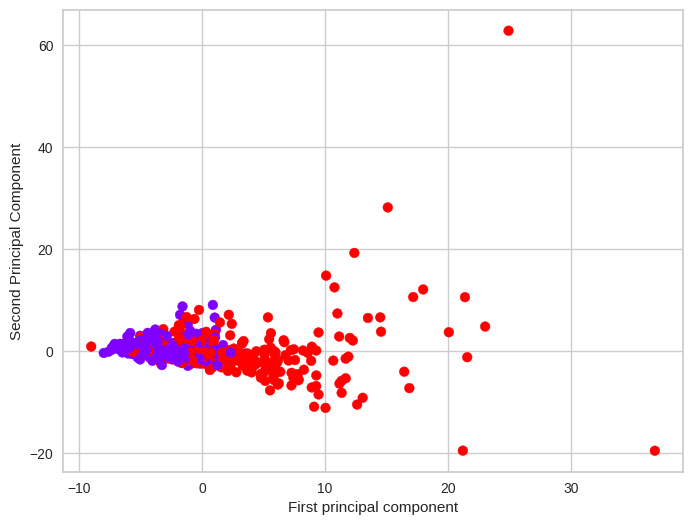

In [140]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=covid_icu_df['ICU'],cmap='rainbow')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

In [141]:
pca.components_

<IPython.core.display.Javascript object>

array([[-0.00761693,  0.05669759, -0.00423382, ..., -0.02806448,
        -0.03234043,  0.08199382],
       [-0.00292874,  0.00161737, -0.00303475, ...,  0.01933982,
         0.02306678, -0.06624783],
       [ 0.02808364,  0.02700681, -0.02139796, ...,  0.03460649,
         0.04954377, -0.12107301],
       [ 0.01059482, -0.05412719,  0.01151893, ...,  0.00402355,
        -0.00037937,  0.02583137],
       [ 0.00221165, -0.05928388, -0.0176845 , ..., -0.01088458,
        -0.05389467,  0.12949314],
       [-0.01765375, -0.09225914, -0.03498775, ...,  0.02585492,
         0.02150157, -0.06840848]])

In [142]:
from sklearn.linear_model import LogisticRegression
X_train_pca, X_test_pca, y_train, y_test = train_test_split(x_pca, y, test_size=0.2, random_state=30)

model = LogisticRegression(max_iter=1000)
model.fit(X_train_pca, y_train)
model.score(X_test_pca, y_test)

<IPython.core.display.Javascript object>

0.8256880733944955

In [143]:
#lets do for less components
pca = PCA(n_components = 2)
pca.fit(scaled_data)

<IPython.core.display.Javascript object>

PCA(n_components=2)

In [144]:
x_pca = pca.transform(scaled_data)
x_pca.shape

<IPython.core.display.Javascript object>

(545, 2)

<IPython.core.display.Javascript object>

Text(0, 0.5, 'Second Principal Component')

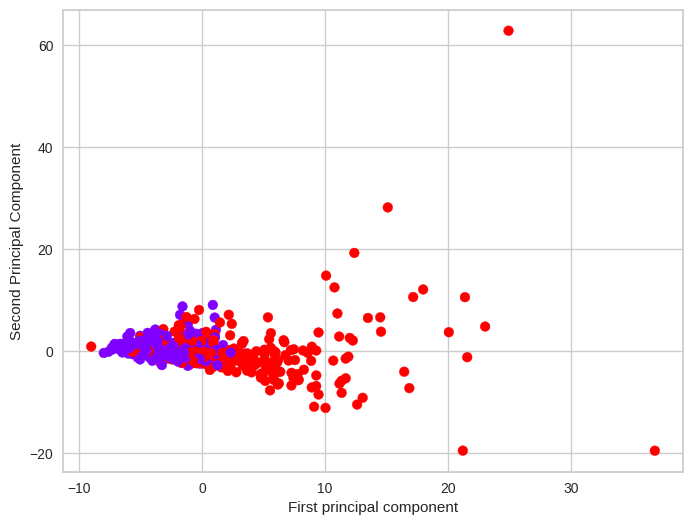

In [145]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=covid_icu_df['ICU'],cmap='rainbow')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

In [147]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(x_pca, y, test_size=0.2, random_state=30)

model = LogisticRegression(max_iter=1000)
model.fit(X_train_pca, y_train)
model.score(X_test_pca, y_test)

<IPython.core.display.Javascript object>

0.8165137614678899

##**Support Vector Machine (SVM)**##

In [148]:
from IPython.display import Image
%matplotlib inline
import numpy as np
import pandas as pd

<IPython.core.display.Javascript object>

In [149]:
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

# To check recent matplotlib compatibility
import matplotlib
from distutils.version import LooseVersion


<IPython.core.display.Javascript object>

In [150]:
import csv

covid_svc_np = np.array(covid_icu_df)
display(covid_svc_np)


<IPython.core.display.Javascript object>

array([[  0.,   1.,   0., ...,   0.,   0.,   1.],
       [  1.,   1.,   1., ...,   0.,   0.,   0.],
       [  1.,   1.,   1., ...,   0.,   1.,   0.],
       ...,
       [383.,   0.,   1., ...,   0.,   0.,   1.],
       [384.,   0.,   1., ...,   0.,   0.,   0.],
       [384.,   0.,   1., ...,   0.,   0.,   1.]])

In [151]:
index_vital_O2 = np.where(covid_svc_np =='OXYGEN_SATURATION_MEAN')
print(index_vital_O2)

<IPython.core.display.Javascript object>

(array([], dtype=int64),)


In [152]:
index_vital_TEMP = np.where(covid_svc_np =='TEMPERATURE_MEAN')
print(index_vital_TEMP)

<IPython.core.display.Javascript object>

(array([], dtype=int64),)


In [153]:
index_ICU = np.where(covid_svc_np =='ICU')
print(index_ICU)


<IPython.core.display.Javascript object>

(array([], dtype=int64),)


In [155]:
#copy first row
covid_label = covid_svc_np[0]

<IPython.core.display.Javascript object>

In [157]:
covid_svc_np_nolabel = np.delete(covid_svc_np,(0),axis=0)

<IPython.core.display.Javascript object>

In [158]:
display(covid_svc_np_nolabel)

<IPython.core.display.Javascript object>

array([[  1.,   1.,   1., ...,   0.,   0.,   0.],
       [  1.,   1.,   1., ...,   0.,   1.,   0.],
       [  1.,   1.,   1., ...,   0.,   0.,   1.],
       ...,
       [383.,   0.,   1., ...,   0.,   0.,   1.],
       [384.,   0.,   1., ...,   0.,   0.,   0.],
       [384.,   0.,   1., ...,   0.,   0.,   1.]])

In [159]:
from sklearn.model_selection import train_test_split

#print(covid_svc_np[:,0])
target = covid_svc_np_nolabel[0:,230]
y= target

X = covid_svc_np_nolabel[:,[197,198]]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

<IPython.core.display.Javascript object>

In [160]:
X[:,[0,1]]

<IPython.core.display.Javascript object>

array([[ 0.89473684, -0.40740741],
       [ 1.        , -0.50617284],
       [ 0.84197658, -0.18518519],
       ...,
       [ 0.70598911, -0.16049383],
       [ 0.57894737,  0.08641975],
       [ 0.6622807 , -0.16049383]])

In [161]:
X.dtype

<IPython.core.display.Javascript object>

dtype('float64')

In [163]:
y.dtype

<IPython.core.display.Javascript object>

dtype('float64')

In [164]:
len(X_train)

<IPython.core.display.Javascript object>

380

In [166]:
len(y_train)

<IPython.core.display.Javascript object>

380

In [167]:
len(X_test)

<IPython.core.display.Javascript object>

164

In [168]:
len(y_test)

<IPython.core.display.Javascript object>

164

In [169]:
from sklearn.svm import SVC
model = SVC()

<IPython.core.display.Javascript object>

In [170]:
model.fit(X_train, y_train)

<IPython.core.display.Javascript object>

SVC()

##**Multiple Linear Regression**

In [171]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn import linear_model
import seaborn as sns

<IPython.core.display.Javascript object>

In [172]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

<IPython.core.display.Javascript object>

In [189]:
target = covid_icu_df['ICU']
y=target

<IPython.core.display.Javascript object>

In [178]:
#drop_target
X = covid_icu_df.drop(["ICU"],axis=1)
X = covid_icu_df.drop(["PATIENT_VISIT_IDENTIFIER"],axis=1)
X.head()

<IPython.core.display.Javascript object>

,AGE_ABOVE65,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,IMMUNOCOMPROMISED,OTHER,ALBUMIN_MEDIAN,ALBUMIN_MEAN,ALBUMIN_MIN,ALBUMIN_MAX,ALBUMIN_DIFF,BE_ARTERIAL_MEDIAN,BE_ARTERIAL_MEAN,BE_ARTERIAL_MIN,BE_ARTERIAL_MAX,BE_ARTERIAL_DIFF,BE_VENOUS_MEDIAN,BE_VENOUS_MEAN,BE_VENOUS_MIN,BE_VENOUS_MAX,BE_VENOUS_DIFF,BIC_ARTERIAL_MEDIAN,BIC_ARTERIAL_MEAN,BIC_ARTERIAL_MIN,BIC_ARTERIAL_MAX,BIC_ARTERIAL_DIFF,BIC_VENOUS_MEDIAN,BIC_VENOUS_MEAN,BIC_VENOUS_MIN,BIC_VENOUS_MAX,BIC_VENOUS_DIFF,BILLIRUBIN_MEDIAN,BILLIRUBIN_MEAN,BILLIRUBIN_MIN,BILLIRUBIN_MAX,BILLIRUBIN_DIFF,BLAST_MEDIAN,BLAST_MEAN,BLAST_MIN,BLAST_MAX,BLAST_DIFF,CALCIUM_MEDIAN,CALCIUM_MEAN,CALCIUM_MIN,CALCIUM_MAX,CALCIUM_DIFF,CREATININ_MEDIAN,CREATININ_MEAN,CREATININ_MIN,CREATININ_MAX,CREATININ_DIFF,FFA_MEDIAN,FFA_MEAN,FFA_MIN,FFA_MAX,FFA_DIFF,GGT_MEDIAN,GGT_MEAN,GGT_MIN,GGT_MAX,GGT_DIFF,GLUCOSE_MEDIAN,GLUCOSE_MEAN,GLUCOSE_MIN,GLUCOSE_MAX,GLUCOSE_DIFF,HEMATOCRITE_MEDIAN,HEMATOCRITE_MEAN,HEMATOCRITE_MIN,HEMATOCRITE_MAX,HEMATOCRITE_DIFF,HEMOGLOBIN_MEDIAN,HEMOGLOBIN_MEAN,HEMOGLOBIN_MIN,HEMOGLOBIN_MAX,HEMOGLOBIN_DIFF,INR_MEDIAN,INR_MEAN,INR_MIN,INR_MAX,INR_DIFF,LACTATE_MEDIAN,LACTATE_MEAN,LACTATE_MIN,LACTATE_MAX,LACTATE_DIFF,LEUKOCYTES_MEDIAN,LEUKOCYTES_MEAN,LEUKOCYTES_MIN,LEUKOCYTES_MAX,LEUKOCYTES_DIFF,LINFOCITOS_MEDIAN,LINFOCITOS_MEAN,LINFOCITOS_MIN,LINFOCITOS_MAX,LINFOCITOS_DIFF,NEUTROPHILES_MEDIAN,NEUTROPHILES_MEAN,NEUTROPHILES_MIN,NEUTROPHILES_MAX,NEUTROPHILES_DIFF,P02_ARTERIAL_MEDIAN,P02_ARTERIAL_MEAN,P02_ARTERIAL_MIN,P02_ARTERIAL_MAX,P02_ARTERIAL_DIFF,P02_VENOUS_MEDIAN,P02_VENOUS_MEAN,P02_VENOUS_MIN,P02_VENOUS_MAX,...,PCR_MIN,PCR_MAX,PCR_DIFF,PH_ARTERIAL_MEDIAN,PH_ARTERIAL_MEAN,PH_ARTERIAL_MIN,PH_ARTERIAL_MAX,PH_ARTERIAL_DIFF,PH_VENOUS_MEDIAN,PH_VENOUS_MEAN,PH_VENOUS_MIN,PH_VENOUS_MAX,PH_VENOUS_DIFF,PLATELETS_MEDIAN,PLATELETS_MEAN,PLATELETS_MIN,PLATELETS_MAX,PLATELETS_DIFF,POTASSIUM_MEDIAN,POTASSIUM_MEAN,POTASSIUM_MIN,POTASSIUM_MAX,POTASSIUM_DIFF,SAT02_ARTERIAL_MEDIAN,SAT02_ARTERIAL_MEAN,SAT02_ARTERIAL_MIN,SAT02_ARTERIAL_MAX,SAT02_ARTERIAL_DIFF,SAT02_VENOUS_MEDIAN,SAT02_VENOUS_MEAN,SAT02_VENOUS_MIN,SAT02_VENOUS_MAX,SAT02_VENOUS_DIFF,SODIUM_MEDIAN,SODIUM_MEAN,SODIUM_MIN,SODIUM_MAX,SODIUM_DIFF,TGO_MEDIAN,TGO_MEAN,TGO_MIN,TGO_MAX,TGO_DIFF,TGP_MEDIAN,TGP_MEAN,TGP_MIN,TGP_MAX,TGP_DIFF,TTPA_MEDIAN,TTPA_MEAN,TTPA_MIN,TTPA_MAX,TTPA_DIFF,UREA_MEDIAN,UREA_MEAN,UREA_MIN,UREA_MAX,UREA_DIFF,DIMER_MEDIAN,DIMER_MEAN,DIMER_MIN,DIMER_MAX,DIMER_DIFF,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,BLOODPRESSURE_DIASTOLIC_MEDIAN,BLOODPRESSURE_SISTOLIC_MEDIAN,HEART_RATE_MEDIAN,RESPIRATORY_RATE_MEDIAN,TEMPERATURE_MEDIAN,OXYGEN_SATURATION_MEDIAN,BLOODPRESSURE_DIASTOLIC_MIN,BLOODPRESSURE_SISTOLIC_MIN,HEART_RATE_MIN,RESPIRATORY_RATE_MIN,TEMPERATURE_MIN,OXYGEN_SATURATION_MIN,BLOODPRESSURE_DIASTOLIC_MAX,BLOODPRESSURE_SISTOLIC_MAX,HEART_RATE_MAX,RESPIRATORY_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_MAX,BLOODPRESSURE_DIASTOLIC_DIFF,BLOODPRESSURE_SISTOLIC_DIFF,HEART_RATE_DIFF,RESPIRATORY_RATE_DIFF,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,ICU,AGE_PERCENTIL_10th,AGE_PERCENTIL_20th,AGE_PERCENTIL_30th,AGE_PERCENTIL_40th,AGE_PERCENTIL_50th,AGE_PERCENTIL_60th,AGE_PERCENTIL_70th,AGE_PERCENTIL_80th,AGE_PERCENTIL_90th,AGE_PERCENTIL_Above 90th,WINDOW_0-2,WINDOW_2-4,WINDOW_4-6,WINDOW_6-12,WINDOW_ABOVE_12
4,1,0,0,0,0,0,1,1,0.000,0.000,1.000,0.000,0.000,0.000,0.000,-1.000,-0.872,-0.872,-0.872,-0.872,-1.000,-0.864,-0.864,-0.864,-0.864,-1.000,-0.317,-0.317,-0.317,-0.317,-1.000,-0.415,-0.415,-0.415,-0.415,-1.000,-0.979,-0.979,-0.979,-0.979,-1.000,-1.000,-1.000,-1.000,-1.000,-1.000,0.327,0.327,0.327,0.327,-1.000,-0.926,-0.926,-0.926,-0.926,-1.000,-0.859,-0.859,-0.859,-0.859,-1.000,-0.669,-0.669,-0.669,-0.669

In [179]:
X.shape

<IPython.core.display.Javascript object>

(545, 243)

In [180]:
covid_icu_df.rename(columns = {'WINDOW_0-2':'WINDOW_0_2','WINDOW_2-4':'WINDOW_2_4','WINDOW_4-6':'WINDOW_4_6','WINDOW_6-12':'WINDOW_6_12','WINDOW_ABOVE_12':'WINDOW_ABOVE_12'}, inplace=True)

<IPython.core.display.Javascript object>

In [183]:
covid_icu_df.rename(columns = {'AGE_PERCENTIL_Above 90th':'AGE_PERCENTIL_Above_90th'}, inplace=True)

<IPython.core.display.Javascript object>

In [184]:
Xc = sm.add_constant(X) #because we use formula.api
linear_regression=sm.OLS(y,Xc)
fitted_model= linear_regression.fit() #model

<IPython.core.display.Javascript object>

In [186]:
fitted_model.summary()

<IPython.core.display.Javascript object>

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    ICU   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.164e+14
Date:                Tue, 29 Aug 2023   Prob (F-statistic):               0.00
Time:                        00:36:11   Log-Likelihood:                 8286.6
No. Observations:                 545   AIC:                        -1.638e+04
Df Residuals:                     447   BIC:                        -1.596e+04
Df Model:                          97                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
AGE_ABOVE65                        2.22e-16   3.83e-08    5.8e-09      1.000   -7.52e-08    7.52e-08
GENDER                            6.245e-17   7.51e-09   8.31e-09      1.000   -1.48e-08    1.48e-08
DISEASE GROUPING 1                3.261e-16   1.06e-08   3.08e-08      1.000   -2.08e-08    2.08e-08
DISEASE GROUPING 2                6.939e-17   1.79e-08   3.87e-09      1.000   -3.52e-08    3.52e-08
DISEASE GROUPING 3               -3.123e-17   1.16e-08  -2.68e-09      1.000   -2.29e-08    2.29e-08
DISEASE GROUPING 4                -5.69e-16   2.15e-08  -2.65e-08      1.000   -4.22e-08    4.22e-08
DISEASE GROUPING 5                2.776e-17   1.07e-08   2.59e-09      1.000   -2.11e-08    2.11e-08
DISEASE GROUPING 6                2.845e-16    1.4e-08   2.03e-08      1.000   -2.75e-08    2.75e-08
HTN                               -2.29e-16   9.22e-09  -2.48e-08      1.000   -1.81e-08    1.81e-08
IMMUNOCOMPROMISED                 1.596e-16    9.4e-09    1.7e-08      1.000   -1.85e-08    1.85e-08
OTHER                            -9.506e-16   1.25e-08  -7.61e-08      1.000   -2.45e-08    2.45e-08
ALBUMIN_MEDIAN                   -3.109e-15   8.48e-07  -3.67e-09      1.000   -1.67e-06    1.67e-06
ALBUMIN_MEAN                     -1.421e-14   1.09e-06   -1.3e-08      1.000   -2.14e-06    2.14e-06
ALBUMIN_MIN                       1.887e-15   8.58e-07    2.2e-09      1.000   -1.69e-06    1.69e-06
ALBUMIN_MAX                       1.132e-14   8.09e-07    1.4e-08      1.000   -1.59e-06    1.59e-06
ALBUMIN_DIFF                     -1.164e-10      0.287  -4.06e-10      1.000      -0.563       0.563
BE_ARTERIAL_MEDIAN                 1.51e-14   1.42e-06   1.06e-08      1.000    -2.8e-06     2.8e-06
BE_ARTERIAL_MEAN                  3.553e-15   1.22e-06   2.92e-09      1.000   -2.39e-06    2.39e-06
BE_ARTERIAL_MIN                  -5.329e-15   8.78e-07  -6.07e-09      1.000   -1.72e-06    1.72e-06
BE_ARTERIAL_MAX                  -2.132e-14   2.17e-06  -9.82e-09      1.000   -4.26e-06    4.26e-06
BE_ARTERIAL_DIFF                          0      0.287          0      1.000      -0.563       0.563
BE_VENOUS_MEDIAN                 -5.329e-15   1.32e-06  -4.05e-09      1.000   -2.59e-06    2.59e-06
BE_VENOUS_MEAN                   -1.776e-15   4.45e-07     -4e-09      1.000   -8.74e-07    8.74e-07
BE_VENOUS_MIN                     7.105e-15   8.91e-07   7.97e-09      1.000   -1.75e-06    1.75e-06
BE_VENOUS_MAX                     2.442e-15   8.11e-07   3.01e-09      1.000   -1.59e-06    1.59e-06
BE_VENOUS_DIFF                   -6.985e-10      0.287  -2.44e-09      1.000      -0.563       0.563
BIC_ARTERIAL_MEDIAN                       0   1.47e-06          0      1.000   -2.89e-06    2.89e-06
BIC_ARTERIAL_MEAN                 7.105e-15   5.87e-0